**Классы:**
- Реальные лица
- Синтетические лица  

**Структура:**
- train_images - 50_000 images
- test_images - 10_000 images
- train_solution - метки классов для обуч выборки(0, 1)
#### **Особенности датасета:**
- Дисбаланс классов
- Наличие шума


### Преобразуем датасет в другой датасет, разбив датасет на 80% трейн 20% тест, сохраняя при этом баланс классов

In [ ]:
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
import torch
import torch.nn as nn
from torchvision import datasets
from torchvision.transforms import transforms
from torchinfo import summary
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, random_split, Dataset
import pandas as pd
import numpy as np
import os
from PIL import Image
%matplotlib inline

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
# exeption
# res-net 50
# optina - библиотека подбора гиперпараметров

import os
import shutil
import csv


""" скрипт для того чтобы разделить изображения по папкам их класса с разделеним """


path_csv_file = "dataset/train_solution.csv"
path_dataset = "dataset/train_images"
path_new_dataset = "new_dataset"
# path_new_dataset = "dataset90" # train 90 | valid 10
train_fake = False
train_real = False
count_fake = 0
count_real = 0
need_fake = 850 * 2
need_real = 4150 * 2
# need_fake = 850 # train 90 | valid 10
# need_real = 4150 # train 90 | valid 10
if not(path_new_dataset in os.listdir()):
    os.mkdir(path_new_dataset)
    os.mkdir(f'{path_new_dataset}/train_dataset')
    os.mkdir(f'{path_new_dataset}/train_dataset/0')
    os.mkdir(f'{path_new_dataset}/train_dataset/1')

    os.mkdir(f'{path_new_dataset}/test_dataset')
    os.mkdir(f'{path_new_dataset}/test_dataset/0')
    os.mkdir(f'{path_new_dataset}/test_dataset/1')

    with open(path_csv_file) as csv_file:
        for img, deapfake in csv.reader(csv_file, delimiter=','):
            if int(img) % 5000 == 0:
                print(img)
            img = img + '.jpg'
            if bool(int(deapfake)):
                if not train_fake:
                    shutil.copy(f"{path_dataset}/{img}", f'{path_new_dataset}/test_dataset/1')
                    count_fake += 1
                    if count_fake == need_fake:
                        train_fake = True
                else:
                    shutil.copy(f"{path_dataset}/{img}", f'{path_new_dataset}/train_dataset/1')
            else:
                if not train_real:
                    shutil.copy(f"{path_dataset}/{img}", f'{path_new_dataset}/test_dataset/0')
                    count_real += 1
                    if count_real == need_real:
                        train_real = True
                else:
                    shutil.copy(f"{path_dataset}/{img}", f'{path_new_dataset}/train_dataset/0')

In [ ]:

"""делаем тоже самое, но создаем отдельно шумный датасет, в дамнно случае train - 80, val - 20"""
path_noisy_dataset = "noisy_dataset"
if not(path_noisy_dataset in os.listdir()):
    os.mkdir(path_noisy_dataset)
    os.mkdir(f'{path_noisy_dataset}/train_dataset')
    os.mkdir(f'{path_noisy_dataset}/train_dataset/0')
    os.mkdir(f'{path_noisy_dataset}/train_dataset/1')

    os.mkdir(f'{path_noisy_dataset}/test_dataset')
    os.mkdir(f'{path_noisy_dataset}/test_dataset/0')
    os.mkdir(f'{path_noisy_dataset}/test_dataset/1')
    
    
    with open(path_csv_file) as csv_file:
        for img, deapfake in csv.reader(csv_file, delimiter=','):
            if int(img) % 5000 == 0:
                print(img)
            img = img + '.jpg'
            if bool(int(deapfake)):
                if not train_fake:
                    shutil.copy(f"{path_dataset}/{img}", f'{path_noisy_dataset}/test_dataset/1')
                    count_fake += 1
                    if count_fake == need_fake:
                        train_fake = True
                else:
                    shutil.copy(f"{path_dataset}/{img}", f'{path_noisy_dataset}/train_dataset/1')
            else:
                if not train_real:
                    shutil.copy(f"{path_dataset}/{img}", f'{path_noisy_dataset}/test_dataset/0')
                    count_real += 1
                    if count_real == need_real:
                        train_real = True
                else:
                    shutil.copy(f"{path_dataset}/{img}", f'{path_noisy_dataset}/train_dataset/0')

In [3]:
"""тут уже train - 90, val - 10"""


path_noisy_dataset90 = "noisy_dataset90"
if not(path_noisy_dataset90 in os.listdir()):
    os.mkdir(path_noisy_dataset90)
    os.mkdir(f'{path_noisy_dataset90}/train_dataset')
    os.mkdir(f'{path_noisy_dataset90}/train_dataset/0')
    os.mkdir(f'{path_noisy_dataset90}/train_dataset/1')

    os.mkdir(f'{path_noisy_dataset90}/test_dataset')
    os.mkdir(f'{path_noisy_dataset90}/test_dataset/0')
    os.mkdir(f'{path_noisy_dataset90}/test_dataset/1')
    
    
    with open(path_csv_file) as csv_file:
        for img, deapfake in csv.reader(csv_file, delimiter=','):
            if int(img) % 5000 == 0:
                print(img)
            img = img + '.jpg'
            if bool(int(deapfake)):
                if not train_fake:
                    shutil.copy(f"{path_dataset}/{img}", f'{path_noisy_dataset90}/test_dataset/1')
                    count_fake += 1
                    if count_fake == need_fake:
                        train_fake = True
                else:
                    shutil.copy(f"{path_dataset}/{img}", f'{path_noisy_dataset90}/train_dataset/1')
            else:
                if not train_real:
                    shutil.copy(f"{path_dataset}/{img}", f'{path_noisy_dataset90}/test_dataset/0')
                    count_real += 1
                    if count_real == need_real:
                        train_real = True
                else:
                    shutil.copy(f"{path_dataset}/{img}", f'{path_noisy_dataset90}/train_dataset/0')

In [ ]:
""" Читаем впервые датасет, смотрим на данные """

import torch
import torch.nn as nn
from torchvision import datasets
from torchvision.transforms import transforms
from torchinfo import summary
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, random_split, Dataset
import pandas as pd
import numpy as np
import os
from PIL import Image
%matplotlib inline

class CreateDS_Images_CSV(Dataset):
    def __init__(self, csv: str, images_folder: str, transform: transforms = None):
        self.df = pd.read_csv(csv, header=None)
        self.transform = transform
        self.images_folder = images_folder

    def __getitem__(self, index: int):
        image_name = self.df.iloc[index, 0]
        label = self.df.iloc[index, 1]

        image_path = os.path.join(self.images_folder, str(image_name) + ".jpg")
        image = Image.open(image_path)


        if self.transform:
            image = self.transform(image)

        return image, label

    def __len__(self):
        return len(self.df)

train_transform = transforms.Compose([
    transforms.ToTensor()]
) 



train_ds = CreateDS_Images_CSV("./dataset/train_solution.csv", "./dataset/train_images", train_transform)


train_solution = pd.read_csv("./dataset/train_solution.csv", header=None)
train_solution = train_solution.rename(columns={0:"idx_image",1: "real/fake"})
train_solution


,idx_image,real/fake
0,0,0
1,1,1
2,2,1
3,3,0
4,4,0
...,...,...
49995,49995,0
49996,49996,0
49997,49997,0
49998,49998,0


In [5]:
train_solution.groupby("real/fake").count()

,idx_image
real/fake,
0,41500
1,8500


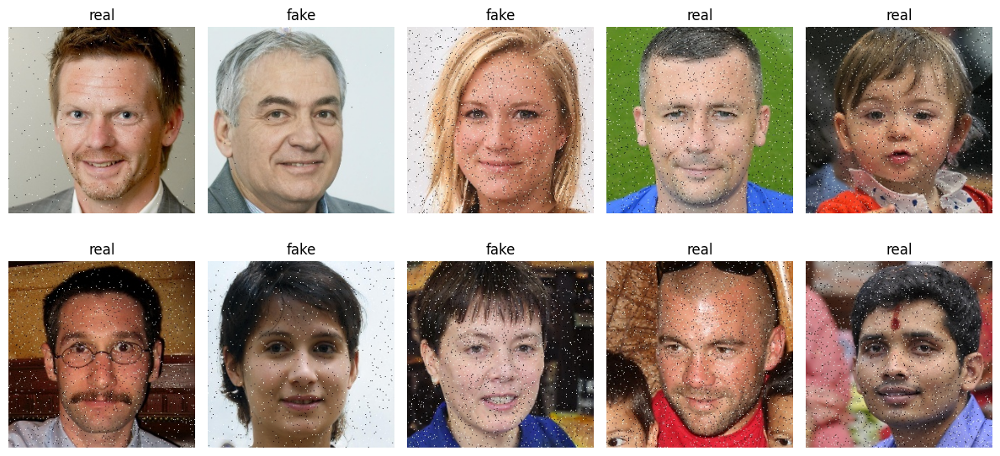

In [6]:
train_classes = ["real", "fake"]
plt.figure(figsize=(12, 6))

for i in range(10):
    plt.subplot(2, 5, i + 1)
    image, label = train_ds[i]
    image = image.numpy().transpose(1, 2, 0)
    plt.imshow(image)
    plt.title(f'{"real" if label == 0 else "fake"}')
    plt.axis(False)
plt.tight_layout()
plt.show()

In [7]:
print(len(train_ds.df))

50000


In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

### данные из нового датасета, разделенные на train val test

In [9]:
from torchvision.datasets import ImageFolder
from torch.utils.data import random_split

train_data_path = "./new_dataset/train_dataset"

train_transforms = transforms.Compose([
    transforms.ToTensor()
])

train_dataset = ImageFolder(train_data_path, transform=train_transforms)

n = len(train_dataset)
train_n = int(n * 0.8)
val_n = int(n * 0.1)
test_n = n - train_n - val_n

train_dataset, val_dataset, test_dataset = random_split(train_dataset, [train_n, val_n, test_n])

batch_size = 32 
train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

# Модели

### UNet

In [10]:
class UNetForDenoise(nn.Module):
    def __init__(self):
        super(UNetForDenoise, self).__init__()
        
        self.encoder_1 = nn.Sequential( # 256x256 -> 256x256
            nn.Conv2d(3, 32, kernel_size=3, padding=1), 
            nn.ReLU(),

            nn.Conv2d(32, 32, kernel_size=3, padding=1), 
            nn.ReLU(),
        )

        self.max_pool_1 = nn.MaxPool2d(kernel_size=2) # 256x256 -> 128x128

        self.encoder_2 = nn.Sequential( # 128x128 -> 128x128
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),

            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
        )
        
        self.max_pool_2 = nn.MaxPool2d(kernel_size=2) # 128x128 -> 64x64

        self.encoder_3 = nn.Sequential( # 64x64 -> 64x64
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),

            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(),
        )

        self.max_pool_3 = nn.MaxPool2d(kernel_size=2) # 64x64 -> 32x32

        self.botneck = nn.Sequential( # 32x32 -> 32x32
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(),
            
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(),
        )

        self.upconv_3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2) # 32x32 -> 64x64
        self.decoder_3 = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1), # 256 = 128(upconv) + 128(skip), 64x64 -> 64x64
            nn.ReLU(),

            nn.Conv2d(128, 128, kernel_size=3, padding=1), # 64x64 -> 64x64
            nn.ReLU(),
        )
        
        self.upconv_2 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2) # 64x64 -> 128x128
        self.decoder_2 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1), # 128 = 64(upconv) + 64(skip), 128x128 -> 128x128
            nn.ReLU(),
            
            nn.Conv2d(64, 64, kernel_size=3, padding=1), # 128x128 -> 128x128
            nn.ReLU(),
        )
        
        self.upconv_1 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2) # 128x128 -> 256x256
        self.decoder_1 = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, padding=1), # 64 = 32(upconv) + 32(skip), 256x256 -> 256x256
            nn.ReLU(),

            nn.Conv2d(32, 32, kernel_size=3, padding=1), # 256x256 -> 256x256
            nn.ReLU(),
        )
         
        self.output = nn.Conv2d(32, 3, 1) # 256x256 -> 256x256
        
    def encode(self, x: torch.Tensor) -> torch.Tensor:
        x1 = self.encoder_1(x) # [batch, 32, 256, 256]
        x2 = self.encoder_2(self.max_pool_1(x1)) # [batch, 64, 128, 128]
        x3 = self.encoder_3(self.max_pool_2(x2)) # [batch, 128, 64, 64]
        x4 = self.botneck(self.max_pool_3(x3)) # [batch, 256, 32, 32]
        return x4

        
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Выходы энкодеров, сохраняем для skip-connections
        encoder_1_output = self.encoder_1(x)                     # [batch, 32, 256, 256]
        max_pool_1_output = self.max_pool_1(encoder_1_output)     # [batch, 32, 128, 128]

        encoder_2_output = self.encoder_2(max_pool_1_output)      # [batch, 64, 128, 128]
        max_pool_2_output = self.max_pool_2(encoder_2_output)     # [batch, 64, 64, 64]

        encoder_3_output = self.encoder_3(max_pool_2_output)      # [batch, 128, 64, 64]
        max_pool_3_output = self.max_pool_3(encoder_3_output)     # [batch, 128, 32, 32]

        # Боттлнек (самый глубокий слой)
        botneck_output = self.botneck(max_pool_3_output)          # [batch, 256, 32, 32]

        # Декодеры со skip-connections
        # Уровень 1 декодера
        upconv_3_output = self.upconv_3(botneck_output)           # [batch, 128, 64, 64]
        decoder_3_input = torch.cat([upconv_3_output, encoder_3_output], dim=1)  # [batch, 256, 64, 64]
        decoder_3_output = self.decoder_3(decoder_3_input)        # [batch, 128, 64, 64]
        
        # Уровень 2 декодера
        upconv_2_output = self.upconv_2(decoder_3_output)         # [batch, 64, 128, 128]
        decoder_2_input = torch.cat([upconv_2_output, encoder_2_output], dim=1)  # [batch, 128, 128, 128]
        decoder_2_output = self.decoder_2(decoder_2_input)        # [batch, 64, 128, 128]

        # Уровень 3 декодера
        upconv_1_output = self.upconv_1(decoder_2_output)         # [batch, 32, 256, 256]
        decoder_1_input = torch.cat([upconv_1_output, encoder_1_output], dim=1)  # [batch, 64, 256, 256]
        decoder_1_output = self.decoder_1(decoder_1_input)        # [batch, 32, 256, 256]

        # Выход
        output = self.output(decoder_1_output)               # [batch, 3, 256, 256]
        return output


denoise_UNet_model = UNetForDenoise().to(device)

### ResNet

In [11]:
# класс одного блока со сверткой
class ResNetBlock(nn.Module):
    def __init__(self, channels: int):
        super(ResNetBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
        )
    def forward(self, x: torch.Tensor) -> nn.Sequential:
        return x + self.block(x)

# сам ResNet
class DenoiseResNet(nn.Module):
    def __init__(self, cnt_blocks: int):
        super(DenoiseResNet, self).__init__()
        
        self.input = nn.Conv2d(3, 64, kernel_size=3, padding=1) # преобразуем до нужного кол-ва фильтров
        
        blocks = []
        for _ in range(cnt_blocks):
            blocks.append(ResNetBlock(64))
        self.blocks = nn.Sequential(*blocks) # создаем последовательность из 20 блоков Conv2d(64, 64) это позволяет ResNet уловить больше деталей
        
        self.output = nn.Conv2d(64, 3, kernel_size=3, padding=1) # возращаемся к исходному кол-ву фильтров
    
    # зедсь размер изображения не меняется
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.input(x)
        x = self.blocks(x)
        output = self.output(x)
        return output
        
denoise_ResNet_model = DenoiseResNet(20).to(device)
denoise_ResNet_model

DenoiseResNet(
  (input): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (blocks): Sequential(
    (0): ResNetBlock(
      (block): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU()
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (1): ResNetBlock(
      (block): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU()
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (2): ResNetBlock(
      (block): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU()
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (3): ResNetBlock(
      (block): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU()
        (2): C

### Сверточная модель

In [12]:
from torch import nn

def model():
    return nn.Sequential(
        nn.Conv2d(3, 8, kernel_size=3, padding=1),
        nn.ReLU(),
        nn.Conv2d(8, 8, kernel_size=3, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2), # 128 128,

        nn.Conv2d(8, 16, kernel_size=3, padding=1),
        nn.ReLU(),
        nn.Conv2d(16, 16, kernel_size=3, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2), # 64 64

        nn.Conv2d(16, 32, kernel_size=3, padding=1),
        nn.ReLU(),
        nn.Conv2d(32, 32, kernel_size=3, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2), # 32 32

        nn.Conv2d(32, 64, kernel_size=3, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2), # 16 16
        
        nn.Conv2d(64, 64, kernel_size=3, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2), # 8 8
        
        nn.Flatten(),
        nn.Linear(8 * 8 * 64, 512),
        nn.Linear(512, 2),
    )

class_weight_model = model().to(device)
undersampling_model = model().to(device)
model = model().to(device)
model

Sequential(
  (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU()
  (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU()
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU()
  (7): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU()
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU()
  (12): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU()
  (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (15): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (16): ReLU()
  (17): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (18): Conv2d(64, 64, kernel_size=(3, 3), strid

### ResNet 18

In [13]:
from torch import nn

class BasicBlock_1(nn.Module):
    def __init__(self, in_channels: int):
        super().__init__()
        self.first_conv2d = nn.Conv2d(in_channels=in_channels, out_channels=in_channels, kernel_size=3, stride=1, padding=1, bias=False )
        self.first_norm = nn.BatchNorm2d(in_channels)
        self.act = nn.ReLU()
        self.second_conv2d = nn.Conv2d(in_channels=in_channels, out_channels=in_channels, kernel_size=3, stride=1, padding=1, bias=False )
        self.second_norm = nn.BatchNorm2d(in_channels)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        y = self.first_conv2d(x)
        y = self.first_norm(y)
        y = self.act(y)
        y = self.second_conv2d(y)
        y = self.second_norm(y)
        y = x + y
        y = self.act(y)
        return y
    

class BasicBlock_2(nn.Module):
    def __init__(self, in_channels: int):
        super().__init__()
        self.first_conv2d = nn.Conv2d(in_channels=in_channels, out_channels=in_channels * 2, kernel_size=3, stride=2, padding=1, bias=False )
        self.first_norm = nn.BatchNorm2d(in_channels * 2)
        self.second_conv2d = nn.Conv2d(in_channels=in_channels * 2, out_channels=in_channels * 2, kernel_size=3, stride=1, padding=1, bias=False )
        self.second_norm = nn.BatchNorm2d(in_channels * 2)
        self.act = nn.ReLU()

        self.skip_connection_conv2d = nn.Conv2d(in_channels=in_channels, out_channels=in_channels * 2, stride=2, kernel_size=1, padding=0, bias=False)
        self.skip_connection_norm = nn.BatchNorm2d(in_channels * 2)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        y = self.first_conv2d(x)
        y = self.first_norm(y)
        y = self.act(y)
        y = self.second_conv2d(y)
        y = self.second_norm(y)

        x = self.skip_connection_conv2d(x)
        x = self.skip_connection_norm(x)
        
        y = x + y
        y = self.act(y)
        return y


class ResNet18(nn.Module):
    def __init__(self):
        super().__init__()
        self.first_conv2d = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.first_norm = nn.BatchNorm2d(64)
        self.act = nn.ReLU()
        self.firs_pool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = nn.Sequential(
            BasicBlock_1(64),
            BasicBlock_1(64),
        )
        self.layer2 = nn.Sequential(
            BasicBlock_2(64),
            BasicBlock_1(128),
        )   # in 64 out 128, h / 2 x w / 2
        self.layer3 = nn.Sequential(
            BasicBlock_2(128),
            BasicBlock_1(256),
        )   # in 128 out 256, h / 4 x w / 4
        self.layer4 = nn.Sequential(
            BasicBlock_2(256),
            BasicBlock_1(512),
        )    # in 128 out 512, h / 8 x w / 8
        self.avg_pool = nn.AdaptiveAvgPool2d(output_size=(1, 1))
        self.flatten = nn.Flatten()
        self.linear = nn.Linear(512, 2, bias=True)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.first_conv2d(x)
        x = self.first_norm(x)
        x = self.act(x)
        x = self.firs_pool(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.avg_pool(x)
        x = self.flatten(x)
        x = self.linear(x)
        return x
    

resnet18 = ResNet18()
resnet18

ResNet18(
  (first_conv2d): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (first_norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act): ReLU()
  (firs_pool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock_1(
      (first_conv2d): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (first_norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act): ReLU()
      (second_conv2d): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (second_norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock_1(
      (first_conv2d): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (first_norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=T

### UNet с WeightedRandomSampler

In [14]:
class UNetForClassification(nn.Module):
    def __init__(self):
        super(UNetForClassification, self).__init__()
        
        self.encoder_1 = nn.Sequential( # 256x256 -> 256x256
            nn.Conv2d(3, 32, kernel_size=3, padding=1), 
            nn.ReLU(),
            nn.BatchNorm2d(32),
            nn.Conv2d(32, 32, kernel_size=3, padding=1), 
            nn.ReLU(),
        )

        self.max_pool_1 = nn.MaxPool2d(kernel_size=2) # 256x256 -> 128x128

        self.encoder_2 = nn.Sequential( # 128x128 -> 128x128
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
        )
        
        self.max_pool_2 = nn.MaxPool2d(kernel_size=2) # 128x128 -> 64x64

        self.encoder_3 = nn.Sequential( # 64x64 -> 64x64
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(128),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(),
        )

        self.max_pool_3 = nn.MaxPool2d(kernel_size=2) # 64x64 -> 32x32

        self.botneck = nn.Sequential( # 32x32 -> 32x32
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(256),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(),
        )

        self.upconv_3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2) # 32x32 -> 64x64
        self.decoder_3 = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1), # 256 = 128(upconv) + 128(skip), 64x64 -> 64x64
            nn.ReLU(),
            nn.BatchNorm2d(128),
            nn.Conv2d(128, 128, kernel_size=3, padding=1), # 64x64 -> 64x64
            nn.ReLU(),
        )
        
        self.upconv_2 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2) # 64x64 -> 128x128
        self.decoder_2 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1), # 128 = 64(upconv) + 64(skip), 128x128 -> 128x128
            nn.ReLU(),
            nn.BatchNorm2d(64),            
            nn.Conv2d(64, 64, kernel_size=3, padding=1), # 128x128 -> 128x128
            nn.ReLU(),
        )
        
        self.upconv_1 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2) # 128x128 -> 256x256
        self.decoder_1 = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, padding=1), # 64 = 32(upconv) + 32(skip), 256x256 -> 256x256
            nn.ReLU(),
            nn.BatchNorm2d(32),
            nn.Conv2d(32, 32, kernel_size=3, padding=1), # 256x256 -> 256x256
            nn.ReLU(),
        )
         
        self.pool = nn.AdaptiveAvgPool2d(1) # [bacth, 32, 1, 1]
        self.output = nn.Linear(32, 2) # (real/fake)
        
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Выходы энкодеров, сохраняем для skip-connections
        encoder_1_output = self.encoder_1(x)                     # [batch, 32, 256, 256]
        max_pool_1_output = self.max_pool_1(encoder_1_output)     # [batch, 32, 128, 128]

        encoder_2_output = self.encoder_2(max_pool_1_output)      # [batch, 64, 128, 128]
        max_pool_2_output = self.max_pool_2(encoder_2_output)     # [batch, 64, 64, 64]

        encoder_3_output = self.encoder_3(max_pool_2_output)      # [batch, 128, 64, 64]
        max_pool_3_output = self.max_pool_3(encoder_3_output)     # [batch, 128, 32, 32]

        # Боттлнек (самый глубокий слой)
        botneck_output = self.botneck(max_pool_3_output)          # [batch, 256, 32, 32]

        # Декодеры со skip-connections
        # Уровень 1 декодера
        upconv_3_output = self.upconv_3(botneck_output)           # [batch, 128, 64, 64]
        decoder_3_input = torch.cat([upconv_3_output, encoder_3_output], dim=1)  # [batch, 256, 64, 64]
        decoder_3_output = self.decoder_3(decoder_3_input)        # [batch, 128, 64, 64]
        
        # Уровень 2 декодера
        upconv_2_output = self.upconv_2(decoder_3_output)         # [batch, 64, 128, 128]
        decoder_2_input = torch.cat([upconv_2_output, encoder_2_output], dim=1)  # [batch, 128, 128, 128]
        decoder_2_output = self.decoder_2(decoder_2_input)        # [batch, 64, 128, 128]

        # Уровень 3 декодера
        upconv_1_output = self.upconv_1(decoder_2_output)         # [batch, 32, 256, 256]
        decoder_1_input = torch.cat([upconv_1_output, encoder_1_output], dim=1)  # [batch, 64, 256, 256]
        decoder_1_output = self.decoder_1(decoder_1_input)        # [batch, 32, 256, 256]

        # Выход
        pooled = self.pool(decoder_1_output) # [batch, 32, 1, 1]
        flattened = pooled.view(pooled.size(0), -1) # [batch, 32]
        output = self.output(flattened) # [bacth, 2] 
        
        return output
    
    
UNet_with_WRS_model = UNetForClassification().to(device)

### Inception V1

In [15]:
class ConvBlock(nn.Module):
    def __init__(self,
                 in_channels: int,
                 out_channels: int,
                 kernel_size: int,
                 stride: int,
                 padding: int,
                 bias: bool = False
                 ):
        super(ConvBlock, self).__init__()

        self.conv2d = nn.Conv2d(
            in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size,
            stride=stride, padding=padding, bias=bias)

        self.batchnorm2d = nn.BatchNorm2d(out_channels)

        self.relu = nn.GELU()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv2d(x)
        x = self.batchnorm2d(x)
        x = self.relu(x)
        return x


class InceptionBlock(nn.Module):
    def __init__(self,
                 in_channels: int,
                 out_1x1: int,
                 reduce_3x3: int,
                 out_3x3: int,
                 reduce_5x5: int,
                 out_5x5: int,
                 out_1x1_pooling: int
                 ):
        super(InceptionBlock, self).__init__()

        # 1x1 conv
        self.branch_1 = ConvBlock(in_channels, out_1x1, 1, 1, 0)

        # 1x1 conv -> 3x3 conv
        self.branch_2 = nn.Sequential(ConvBlock(
            in_channels, reduce_3x3, 1, 1, 0), ConvBlock(reduce_3x3, out_3x3, 3, 1, 1))

        # 1x1 conv -> 5x5 conv
        self.branch_3 = nn.Sequential(ConvBlock(
            in_channels, reduce_5x5, 1, 1, 0), ConvBlock(reduce_5x5, out_5x5, 5, 1, 2))

        # 3x3 maxpool -> 1x1 conv
        self.branch_4 = nn.Sequential(nn.MaxPool2d(
            kernel_size=3, stride=1, padding=1), ConvBlock(in_channels, out_1x1_pooling, 1, 1, 0))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return torch.cat([self.branch_1(x), self.branch_2(x), self.branch_3(x), self.branch_4(x)], dim=1)


class InceptionV1(nn.Module):
    def __init__(self, in_channels: int, num_classes: int):
        super(InceptionV1, self).__init__()

        self.conv_1 = ConvBlock(in_channels, 64, 7, 2, 3)
        self.maxpool_1 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.conv_2 = nn.Sequential(
            ConvBlock(64, 64, 1, 1, 0), ConvBlock(64, 192, 3, 1, 1))
        self.maxpool_2 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.inception_3_a = InceptionBlock(192, 64, 96, 128, 16, 32, 32)
        self.inception_3_b = InceptionBlock(256, 128, 128, 192, 32, 96, 64)
        self.maxpool_3 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.inception_4_a = InceptionBlock(480, 192, 96, 208, 16, 48, 64)
        self.inception_4_b = InceptionBlock(512, 160, 112, 224, 24, 64, 64)
        self.inception_4_c = InceptionBlock(512, 128, 128, 256, 24, 64, 64)
        self.inception_4_d = InceptionBlock(512, 112, 144, 288, 32, 64, 64)
        self.inception_4_e = InceptionBlock(528, 256, 160, 320, 32, 128, 128)
        self.maxpool_4 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.inception_5_a = InceptionBlock(832, 256, 160, 320, 32, 128, 128)
        self.inception_5_b = InceptionBlock(832, 384, 192, 384, 48, 128, 128)

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.dropout = nn.Dropout(p=0.4)
        self.feature_dim = 1024
        self.fc1 = nn.Linear(1024, num_classes)

    
    # разделение forward нужно для pretrain 
    def forward_features(self, x: torch.Tensor) -> torch.Tensor: 
        x = self.conv_1(x)
        # print('conv_1',x.shape)
        x = self.maxpool_1(x)
        # print('maxpool_1',x.shape)

        x = self.conv_2(x)
        # print('conv_2',x.shape)
        x = self.maxpool_2(x)
        # print('maxpool_2',x.shape)

        x = self.inception_3_a(x)
        # print('3_a',x.shape)

        x = self.inception_3_b(x)
        # print('3_b',x.shape)

        x = self.maxpool_3(x)
        # print('3_b_max',x.shape)

        x = self.inception_4_a(x)
        # print('4_a',x.shape)

        x = self.inception_4_b(x)
        # print('4_b',x.shape)

        x = self.inception_4_c(x)
        # print('4_c',x.shape)

        x = self.inception_4_d(x)
        # print('4_d',x.shape)

        x = self.inception_4_e(x)
        # print('4_e',x.shape)

        x = self.maxpool_4(x)
        # print('maxpool',x.shape)

        x = self.inception_5_a(x)
        # print('5_a',x.shape)

        x = self.inception_5_b(x)
        # print('5_b',x.shape)

        x = self.avgpool(x)
        # print('AvgPool',x.shape)

        x = self.dropout(x)
        x = torch.flatten(x, 1)
        
        return x


    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.forward_features(x)
        x = self.fc1(x)
        
        return x

x = torch.randn((32, 3, 256, 256)).to(device)
inception_model = InceptionV1(3, 2)

### Inception V3

In [16]:
class InceptionA(nn.Module):
    def __init__(self, in_channels: int, pool_channels: int):
        super().__init__()
        
        self.branch_1 = ConvBlock(in_channels, 64, 1, 1, 0)

        self.branch_2 = nn.Sequential(
            ConvBlock(in_channels, 48, 1, 1, 0),
            ConvBlock(48, 64, 5, 1, 2),
        )

        self.branch_3 = nn.Sequential(
            ConvBlock(in_channels, 64, 1, 1, 0),
            ConvBlock(64, 96, 3, 1, 1),
            ConvBlock(96, 96, 3, 1, 1),
        )

        self.branch_4 = nn.Sequential(
            nn.AvgPool2d(3, stride=1, padding=1),
            ConvBlock(in_channels, pool_channels, 1, 1, 0),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return torch.cat([
            self.branch_1(x),
            self.branch_2(x),
            self.branch_3(x),
            self.branch_4(x)
        ], dim=1)

        
class InceptionB(nn.Module):
    def __init__(self, in_channels):
        super().__init__()

        self.branch_1 = ConvBlock(in_channels, 192, 1, 1, 0)

        self.branch_2 = nn.Sequential(
            ConvBlock(in_channels, 128, 1, 1, 0),
            ConvBlock(128, 128, (1, 7), 1, (0, 3)),
            ConvBlock(128, 192, (7, 1), 1, (3, 0)),
        )

        self.branch_3 = nn.Sequential(
            ConvBlock(in_channels, 128, 1, 1, 0),
            ConvBlock(128, 128, (7, 1), 1, (3, 0)),
            ConvBlock(128, 128, (1, 7), 1, (0, 3)),
            ConvBlock(128, 128, (7, 1), 1, (3, 0)),
            ConvBlock(128, 192, (1, 7), 1, (0, 3)),
        )

        self.branch_4 = nn.Sequential(
            nn.AvgPool2d(3, stride=1, padding=1),
            ConvBlock(in_channels, 192, 1, 1, 0),
        )
        
    def forward(self, x):
        return torch.cat([
            self.branch_1(x),
            self.branch_2(x),
            self.branch_3(x),
            self.branch_4(x),
        ], dim=1)
        
class InceptionC(nn.Module):
    def __init__(self, in_channels):
        super().__init__()

        self.branch_1 = ConvBlock(in_channels, 320, 1, 1, 0)

        self.branch_2_1 = ConvBlock(in_channels, 384, 1, 1, 0)
        self.branch_2_2a = ConvBlock(384, 384, (1, 3), 1, (0, 1))
        self.branch_2_2b = ConvBlock(384, 384, (3, 1), 1, (1, 0))

        self.branch_3_1 = nn.Sequential(
            ConvBlock(in_channels, 448, 1, 1, 0),
            ConvBlock(448, 384, 3, 1, 1),
        )
        self.branch_3_2a = ConvBlock(384, 384, (1, 3), 1, (0, 1))
        self.branch_3_2b = ConvBlock(384, 384, (3, 1), 1, (1, 0))

        self.branch_4 = nn.Sequential(
            nn.AvgPool2d(3, stride=1, padding=1),
            ConvBlock(in_channels, 192, 1, 1, 0),
        )

    def forward(self, x):
        b1 = self.branch_1(x)

        b2 = self.branch_2_1(x)
        b2 = torch.cat([self.branch_2_2a(b2), self.branch_2_2b(b2)], dim=1)

        b3 = self.branch_3_1(x)
        b3 = torch.cat([self.branch_3_2a(b3), self.branch_3_2b(b3)], dim=1)

        b4 = self.branch_4(x)

        return torch.cat([b1, b2, b3, b4], dim=1)
    
    
class ReductionA(nn.Module):
    def __init__(self, in_channels):
        super().__init__()

        self.branch_1 = ConvBlock(in_channels, 384, 3, 2, 0)

        self.branch_2 = nn.Sequential(
            ConvBlock(in_channels, 64, 1, 1, 0),
            ConvBlock(64, 96, 3, 1, 1),
            ConvBlock(96, 96, 3, 2, 0),
        )

        self.branch_3 = nn.MaxPool2d(3, stride=2)

    def forward(self, x):
        return torch.cat([
            self.branch_1(x),
            self.branch_2(x),
            self.branch_3(x),
        ], dim=1)
        
        
class ReductionB(nn.Module):
    def __init__(self, in_channels):
        super().__init__()

        self.branch_1 = nn.Sequential(
            ConvBlock(in_channels, 192, 1, 1, 0),
            ConvBlock(192, 320, 3, 2, 0),
        )

        self.branch_2 = nn.Sequential(
            ConvBlock(in_channels, 192, 1, 1, 0),
            ConvBlock(192, 192, (1, 7), 1, (0, 3)),
            ConvBlock(192, 192, (7, 1), 1, (3, 0)),
            ConvBlock(192, 192, 3, 2, 0),
        )

        self.branch_3 = nn.MaxPool2d(3, stride=2)

    def forward(self, x):
        return torch.cat([
            self.branch_1(x),
            self.branch_2(x),
            self.branch_3(x),
        ], dim=1)
        

class InceptionV3(nn.Module):
    def __init__(self, in_channels: int, num_classes: int):
        super().__init__()

        self.conv_1 = ConvBlock(in_channels, 32, 3, 2, 0)
        self.conv_2 = ConvBlock(32, 32, 3, 1, 0)
        self.conv_3 = ConvBlock(32, 64, 3, 1, 1)
        self.maxpool_1 = nn.MaxPool2d(3, stride=2)

        self.conv_4 = ConvBlock(64, 80, 1, 1, 0)
        self.conv_5 = ConvBlock(80, 192, 3, 1, 0)
        self.maxpool_2 = nn.MaxPool2d(3, stride=2)

        # -------- 35×35 --------
        self.inception_3_a = InceptionA(192, 32) 
        self.inception_3_b = InceptionA(256, 64)
        self.inception_3_c = InceptionA(288, 64)

        # -------- 35->17 --------
        self.reduction_a = ReductionA(288)

        # -------- 17×17 --------
        self.inception_4_a = InceptionB(768)
        self.inception_4_b = InceptionB(768)
        self.inception_4_c = InceptionB(768)
        self.inception_4_d = InceptionB(768)

        # -------- 17->8 --------
        self.reduction_b = ReductionB(768)

        # -------- 8×8 --------
        self.inception_5_a = InceptionC(1280)
        self.inception_5_b = InceptionC(2048)

        self.avgpool = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(0.5)
        self.fc = nn.Linear(2048, num_classes)

    def forward(self, x):

        x = self.conv_1(x)
        x = self.conv_2(x)
        x = self.conv_3(x)
        x = self.maxpool_1(x)

        x = self.conv_4(x)
        x = self.conv_5(x)
        x = self.maxpool_2(x)

        x = self.inception_3_a(x)
        x = self.inception_3_b(x)
        x = self.inception_3_c(x)

        x = self.reduction_a(x)

        x = self.inception_4_a(x)
        x = self.inception_4_b(x)
        x = self.inception_4_c(x)
        x = self.inception_4_d(x)

        x = self.reduction_b(x)

        x = self.inception_5_a(x)
        x = self.inception_5_b(x)

        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.dropout(x)
        x = self.fc(x)

        return x
    
inception_v3_model = InceptionV3(3, 2).to(device)

### ResNet 50

In [17]:
from torch import nn


class BottleneckBlock_1(nn.Module):
    def __init__(self, in_channels: int):
        super().__init__()
        self.conv2d_1 = nn.Conv2d(in_channels=in_channels, out_channels=in_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.norm = nn.BatchNorm2d(in_channels)
        self.act = nn.ReLU()
        self.conv2d_2 = nn.Conv2d(in_channels=in_channels, out_channels=in_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.norm_2 = nn.BatchNorm2d(in_channels)
        self.conv2d_3 = nn.Conv2d(in_channels=in_channels, out_channels=in_channels * 4, kernel_size=1, stride=1, padding=0, bias=False)
        self.norm_3 = nn.BatchNorm2d(in_channels * 4)
        self.conv2d_skip = nn.Conv2d(in_channels=in_channels, out_channels=in_channels * 4, kernel_size=1, stride=1, padding=0, bias=False)
        self.norm_skip = nn.BatchNorm2d(in_channels * 4)


    def forward(self, x: torch.Tensor) -> torch.Tensor:
        y = self.conv2d_1(x)
        y = self.norm(y)
        y = self.act(y)
        y = self.conv2d_2(y)
        y = self.norm_2(y)
        y = self.act(y)
        y = self.conv2d_3(y)
        y = self.norm_3(y)
        
        x = self.conv2d_skip(x)
        x = self.norm_skip(x)

        return self.act(x + y)
    

class BottleneckBlock_2(nn.Module):
    def __init__(self, in_channels: int):
        super().__init__()
        out_channels = in_channels // 4
        self.conv2d_1 = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.norm = nn.BatchNorm2d(out_channels)
        self.act = nn.ReLU()
        self.conv2d_2 = nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.norm_2 = nn.BatchNorm2d(out_channels)
        self.conv2d_3 = nn.Conv2d(in_channels=out_channels, out_channels=in_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.norm_3 = nn.BatchNorm2d(in_channels)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        y = self.conv2d_1(x)
        y = self.norm(y)
        y = self.act(y)
        y = self.conv2d_2(y)
        y = self.norm_2(y)
        y = self.act(y)
        y = self.conv2d_3(y)
        y = self.norm_3(y)

        return self.act(x + y)
    

class BottleneckBlock_3(nn.Module):
    def __init__(self, in_channels: int):
        super().__init__()
        self.conv2d_1 = nn.Conv2d(in_channels=in_channels, out_channels=in_channels // 2, kernel_size=1, stride=1, padding=0, bias=False)
        self.norm = nn.BatchNorm2d(in_channels // 2)
        self.act = nn.ReLU()
        self.conv2d_2 = nn.Conv2d(in_channels=in_channels // 2, out_channels=in_channels // 2, kernel_size=3, stride=2, padding=1, bias=False)
        self.norm_2 = nn.BatchNorm2d(in_channels // 2)
        self.conv2d_3 = nn.Conv2d(in_channels=in_channels // 2, out_channels=in_channels * 2, kernel_size=1, stride=1, padding=0, bias=False)
        self.norm_3 = nn.BatchNorm2d(in_channels * 2)
        self.conv2d_skip = nn.Conv2d(in_channels=in_channels, out_channels=in_channels * 2, kernel_size=1, stride=2, padding=0, bias=False)
        self.norm_skip = nn.BatchNorm2d(in_channels * 2)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        y = self.conv2d_1(x)
        y = self.norm(y)
        y = self.act(y)
        y = self.conv2d_2(y)
        y = self.norm_2(y)
        y = self.act(y)
        y = self.conv2d_3(y)
        y = self.norm_3(y)

        x = self.conv2d_skip(x)
        x = self.norm_skip(x)

        return self.act(x + y)


# ---------ResNet50-------
class ResNet50(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv2d_1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.norm = nn.BatchNorm2d(64)
        self.act = nn.ReLU()
        self.pool_1 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = nn.Sequential(
            BottleneckBlock_1(64),
            BottleneckBlock_2(64 * 4),
            BottleneckBlock_2(64 * 4),
            )
        self.layer2 = nn.Sequential(
            BottleneckBlock_3(64 * 4),
            BottleneckBlock_2(128 * 4),
            BottleneckBlock_2(128 * 4),
            BottleneckBlock_2(128 * 4),
        )
        self.layer3 = nn.Sequential(
            BottleneckBlock_3(128 * 4),
            BottleneckBlock_2(256 * 4),
            BottleneckBlock_2(256 * 4),
            BottleneckBlock_2(256 * 4),
            BottleneckBlock_2(256 * 4),
            BottleneckBlock_2(256 * 4),
        )
        self.layer4 = nn.Sequential(
            BottleneckBlock_3(256 * 4),
            BottleneckBlock_2(512 * 4),
            BottleneckBlock_2(512 * 4),
        )
        self.pool_2 = nn.AdaptiveAvgPool2d(output_size=(1, 1))
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(512 * 4, 2)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv2d_1(x)
        x = self.norm(x)
        x = self.act(x)
        x = self.pool_1(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.pool_2(x)
        x = self.flatten(x)
        y = self.fc(x)
        return y
    
resnet50 = ResNet50()
resnet50 = resnet50.to(device)
resnet50

ResNet50(
  (conv2d_1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act): ReLU()
  (pool_1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BottleneckBlock_1(
      (conv2d_1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act): ReLU()
      (conv2d_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (norm_2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2d_3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (norm_3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2d_skip): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

# Денойзинг с помощью UNet

In [18]:
summary(denoise_UNet_model)

Layer (type:depth-idx)                   Param #
UNetForDenoise                           --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       896
│    └─ReLU: 2-2                         --
│    └─Conv2d: 2-3                       9,248
│    └─ReLU: 2-4                         --
├─MaxPool2d: 1-2                         --
├─Sequential: 1-3                        --
│    └─Conv2d: 2-5                       18,496
│    └─ReLU: 2-6                         --
│    └─Conv2d: 2-7                       36,928
│    └─ReLU: 2-8                         --
├─MaxPool2d: 1-4                         --
├─Sequential: 1-5                        --
│    └─Conv2d: 2-9                       73,856
│    └─ReLU: 2-10                        --
│    └─Conv2d: 2-11                      147,584
│    └─ReLU: 2-12                        --
├─MaxPool2d: 1-6                         --
├─Sequential: 1-7                        --
│    └─Conv2d: 2-13                      295,168
│

### Создаем специальный датасет состоящий из пар (исходное изображение, чистое)

In [19]:
from typing import Tuple
import cv2
import os
from torch.utils.data import Dataset
from PIL import Image

class NoiseClearDataset(Dataset):
    def __init__(self, images_path: str, transform: transforms = None):
        super(NoiseClearDataset, self).__init__()  
        self.images_path = images_path
        self.transform = transform
        self.filenames = [f for f in os.listdir(images_path)]
        
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, index: int) -> Tuple:
        filename = self.filenames[index] 
        image_path = self.images_path + filename


        noise_image = cv2.imread(image_path)
        clean_image = cv2.medianBlur(noise_image, 3) # cоздаем искусственое чистое изображения за счет сглаживания 

        # переводим в изображение
        noise_image = Image.fromarray(noise_image)
        clean_image = Image.fromarray(clean_image)

    
        if self.transform:
            noise_image = self.transform(noise_image)
            clean_image = self.transform(clean_image)

        return noise_image, clean_image

train_dataset = NoiseClearDataset(
    images_path="./dataset/train_images/",
    transform=train_transforms
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)


### Обучаем наш UNet 

In [20]:
from tqdm import tqdm


def train_denoise_UNet_model(model: UNetForDenoise, epochs: int, loader: DataLoader, device: torch.device) -> UNetForDenoise:
    criterion = nn.L1Loss() # лучше сохраняет изображение(не размывает лишний раз лицо, глаза)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    model.train()
    
    for epoch in range(epochs):
        all_loss = 0
        for noisy, clean in tqdm(loader):
            # перекидываем все на видеокарту
            noisy = noisy.to(device)
            clean = clean.to(device)
            
            optimizer.zero_grad() 
            
            output = model(noisy) 
            loss = criterion(output, clean)  
            
            loss.backward()  
            optimizer.step()  
            
            all_loss += loss.item()  
        

        avg_loss = all_loss / len(train_loader)
        print(f"epoch {epoch+1}/{epochs}, loss: {avg_loss:.4f}")
    
    return model

if "denoiser_weights.pth" not in os.listdir():
    trained_denoise_model = train_denoise_UNet_model(denoise_UNet_model, 1, train_loader, device)
    torch.save(trained_denoise_model.state_dict(), "denoiser_weights.pth")
else:
    trained_denoise_model = UNetForDenoise().to(device)
    trained_denoise_model.load_state_dict(torch.load("denoiser_weights.pth"))



C:\Users\SyFL3sHkA\AppData\Local\Temp\ipykernel_16232\3014485689.py:37: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  trained_denoise_model.load_state_dict(torch.load("denoi

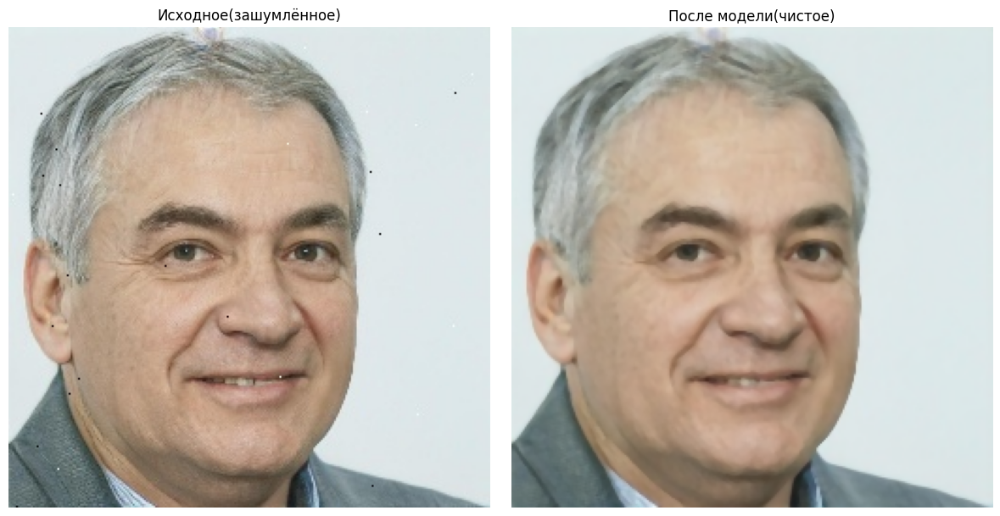

In [21]:
def tensor_to_pil(tensor: torch.Tensor) -> Image:
    tensor = tensor.cpu().clamp(0, 1)
    tensor = (tensor * 255).byte().permute(1, 2, 0).numpy()
    return Image.fromarray(tensor)

def test_single_image(model: UNetForDenoise, image_path: str, transform: transforms, device: torch.device):
    original_img = Image.open(image_path).convert("RGB")
    noisy_tensor = transform(original_img).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():

        denoised_tensor = model(noisy_tensor)
        denoised_tensor = denoised_tensor.squeeze(0)


    denoised_img = tensor_to_pil(denoised_tensor)


    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Исходное(зашумлённое)")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(denoised_img)
    plt.title("После модели(чистое)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

image_path = "./dataset/train_images/1.jpg"

test_single_image(
    model=trained_denoise_model,
    image_path=image_path,
    transform=train_transforms,
    device=device
)


### Изображение получилось давольно мыльным, попробуем использовать наш UNet, но с использованием Noise2Void

##### Функция n2v_mask учит нашу модель предсказывать замаскированные пиксели. Мы берем случайные пиксели и заменяем их на соседние

In [22]:
from typing import Tuple


def n2v_mask(batch: torch.Tensor, device: torch.device, mask_ratio: float = 0.02) -> Tuple[torch.Tensor, torch.Tensor]:
    B, C, H, W = batch.shape

    # маска пикселей, которые будем заменять
    mask = (torch.rand(B, 1, H, W, device=device) < mask_ratio) # создаем рандомную булевую маску, где примерно 2% пикселей False(это и будут замаскированные пиксели)
    mask = mask.expand(-1, C, -1, -1) # здесь мы применяем нашу маску на все каналы(в нашем случае их будет 3 тк изображение в RGB)

    # Берём соседний пиксель (случайный сдвиг) randint(min, max не вкл, shape)
    x = torch.randint(-1, 2, (1,), device=device).item()
    y = torch.randint(-1, 2, (1,), device=device).item()

    neighbor = torch.roll(batch, shifts=(x, y), dims=(2, 3)) # сдвигаем все пиксели(roll - зацикливает изображение, так что разменость не поменяется)

    # создаём копию входных данных
    corrupted = batch.clone()
    corrupted[mask] = neighbor[mask] # зедсь мы меняем пиксели из исходного изображения на пиксели из сдвинутого изображения по маске

    return corrupted, mask


In [23]:
def train_noise2void(model: UNetForDenoise, loader: DataLoader, device: torch.device,
                     epochs: int, lr: float = 1e-4, mask_ratio: float = 0.02):
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.L1Loss()

    for epoch in range(epochs):
        all_loss = 0
        for noisy, _ in tqdm(loader):  # чистое изображение не нужен
            noisy = noisy.to(device)

            # получаем маску и изображение с замененными пикселями
            corrupted, mask = n2v_mask(noisy, mask_ratio)

            output = model(corrupted)

            # считаем loss ТОЛЬКО где mask == True
            loss = criterion(output[mask], noisy[mask])

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            all_loss += loss.item()

        avg_loss = all_loss / len(train_loader)
        print(f"epoch {epoch+1}/{epochs}, loss: {avg_loss:.4f}")

    return model

In [24]:
denoise_UNet_n2v_model = UNetForDenoise().to(device)
if "N2V_UNet_weights.pth" not in os.listdir():
    trained_UNet_n2v = train_noise2void(
        denoise_UNet_n2v_model,
        train_loader,
        device,
        epochs=1,
        lr=1e-4,
        mask_ratio=0.03,
    )

    torch.save(trained_UNet_n2v.state_dict(), "N2V_UNet_weights.pth")
else:
    trained_UNet_n2v = UNetForDenoise().to(device)
    trained_UNet_n2v.load_state_dict(torch.load("N2V_UNet_weights.pth"))

C:\Users\SyFL3sHkA\AppData\Local\Temp\ipykernel_16232\1516575325.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  trained_UNet_n2v.load_state_dict(torch.load("N2V_UNet_w

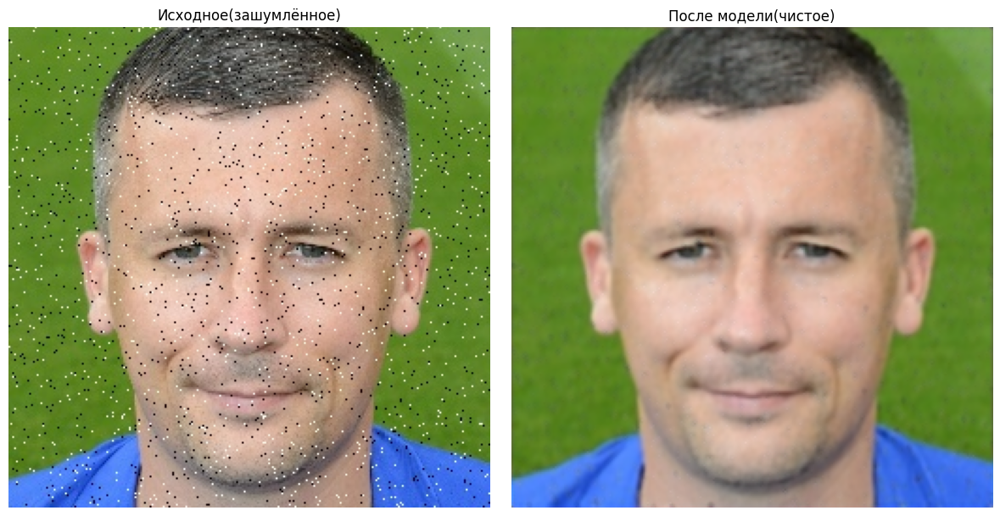

In [25]:
image_path = "./dataset/train_images/3.jpg"

test_single_image(
    model=trained_UNet_n2v,
    image_path=image_path,
    transform=train_transforms,
    device=device
)


### Результат не улучшился

# Денойзинг с помощью ResNet


In [26]:
summary(denoise_ResNet_model)

Layer (type:depth-idx)                   Param #
DenoiseResNet                            --
├─Conv2d: 1-1                            1,792
├─Sequential: 1-2                        --
│    └─ResNetBlock: 2-1                  --
│    │    └─Sequential: 3-1              73,856
│    └─ResNetBlock: 2-2                  --
│    │    └─Sequential: 3-2              73,856
│    └─ResNetBlock: 2-3                  --
│    │    └─Sequential: 3-3              73,856
│    └─ResNetBlock: 2-4                  --
│    │    └─Sequential: 3-4              73,856
│    └─ResNetBlock: 2-5                  --
│    │    └─Sequential: 3-5              73,856
│    └─ResNetBlock: 2-6                  --
│    │    └─Sequential: 3-6              73,856
│    └─ResNetBlock: 2-7                  --
│    │    └─Sequential: 3-7              73,856
│    └─ResNetBlock: 2-8                  --
│    │    └─Sequential: 3-8              73,856
│    └─ResNetBlock: 2-9                  --
│    │    └─Sequential: 3-9         

In [27]:
def train_denoise_ResNet_model(model: DenoiseResNet, epochs: int, loader: DataLoader, device: torch.device) -> DenoiseResNet:
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    criterion = nn.L1Loss()
    model.train()
    
    # GradScaler помогает сохранить грандиенты, он увеличивает маленькие градиенты, чтобы сохранить их, также ускоряет обучение
    scaler = torch.amp.GradScaler(device='cuda')
    
    for epoch in range(epochs):
        all_loss = 0
        for noisy, clean in tqdm(loader):
            noisy = noisy.to(device)
            clean = clean.to(device)
            
            optimizer.zero_grad()
            with torch.amp.autocast(device_type='cuda'):
                output = model(noisy)
                loss = criterion(output, clean)
                
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            
            all_loss += loss.item()

        avg_loss = all_loss / len(train_loader)
        print(f"epoch {epoch+1}/{epochs}, loss: {avg_loss:.4f}")
    
    return model

            
if "denoiser_ResNet_weights.pth" not in os.listdir():
    trained_ResNet_model = train_denoise_ResNet_model(denoise_ResNet_model, 1, train_loader, device)
    torch.save(trained_ResNet_model.state_dict(), "denoiser_ResNet_weights.pth")
else:
    trained_ResNet_model = DenoiseResNet(20).to(device)
    trained_ResNet_model.load_state_dict(torch.load("denoiser_ResNet_weights.pth"))



C:\Users\SyFL3sHkA\AppData\Local\Temp\ipykernel_16232\3794808061.py:37: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  trained_ResNet_model.load_state_dict(torch.load("denois

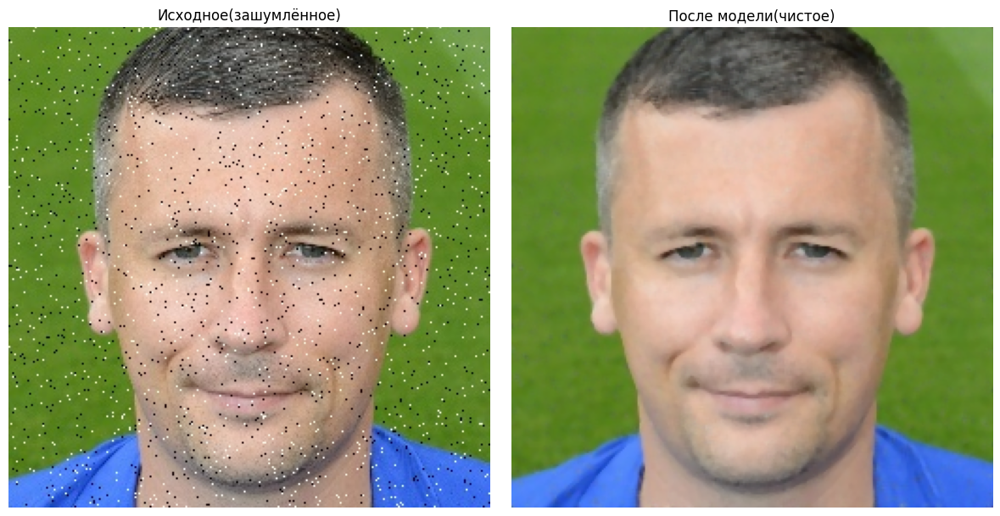

In [28]:
test_single_image(
    model=trained_ResNet_model,
    image_path=image_path,
    transform=train_transforms,
    device=device
)


### Опять мыло

# ResNet + Noise2Void

In [29]:
import torch
from tqdm import tqdm


def train_noise2void(model: DenoiseResNet, loader: DataLoader, device: torch.device,
                     epochs: int, lr: float = 1e-4, mask_ratio: float = 0.02):
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.L1Loss()

    for epoch in range(epochs):
        all_loss = 0
        for noisy, _ in tqdm(loader):  # чистое изображение не нужен
            noisy = noisy.to(device)

            # получаем маску и изображение с замененными пикселями
            corrupted, mask = n2v_mask(noisy, mask_ratio)

            output = model(corrupted)

            # считаем loss ТОЛЬКО где mask == True
            loss = criterion(output[mask], noisy[mask])

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            all_loss += loss.item()

        avg_loss = all_loss / len(train_loader)
        print(f"epoch {epoch+1}/{epochs}, loss: {avg_loss:.4f}")

    return model

In [30]:
ResNet_n2v = DenoiseResNet(20).to(device)
if "N2V_ResNet_weights.pth" not in os.listdir():
    trained_ResNet_n2v_model = train_noise2void(
        ResNet_n2v,
        train_loader,
        device,
        epochs=1,
        lr=1e-4,
        mask_ratio=0.03,
    )

    torch.save(ResNet_n2v.state_dict(), "N2V_ResNet_weights.pth")
else:
    trained_ResNet_n2v_model = DenoiseResNet(20).to(device)
    trained_ResNet_n2v_model.load_state_dict(torch.load("N2V_ResNet_weights.pth"))

C:\Users\SyFL3sHkA\AppData\Local\Temp\ipykernel_16232\3293754700.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  trained_ResNet_n2v_model.load_state_dict(torch.load("N2

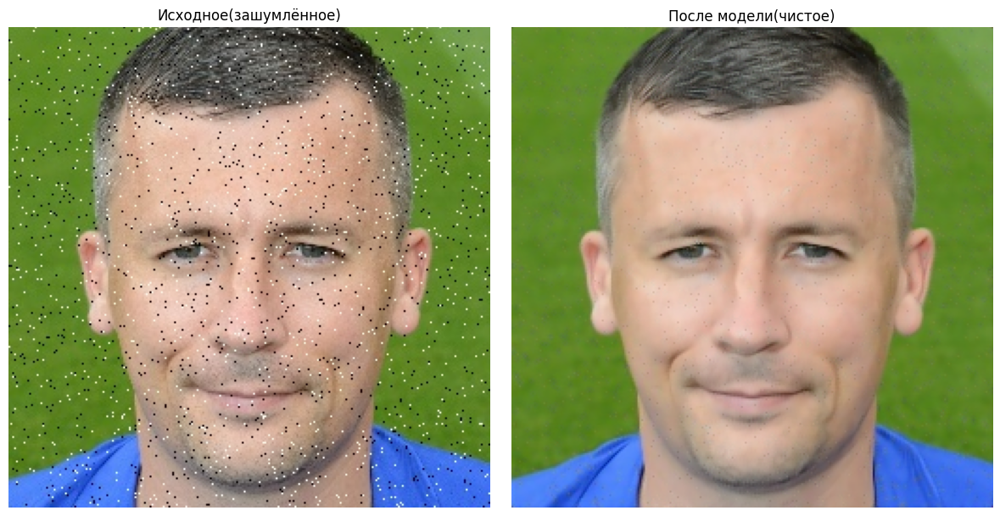

In [31]:
test_single_image(
    model=trained_ResNet_n2v_model,
    image_path=image_path,
    transform=train_transforms,
    device=device
)


### Наконец-то что-то более четкое

# Попробуем простую архитектуру

In [32]:
# будем сглаживать только те пиксели, которые являются шумом
def remove_salt_and_pepper(image:np.ndarray , x: int = 40) -> np.ndarray:
    median = cv2.medianBlur(image, 3).astype(np.int16)

    difference = np.abs(image - median)
    
    # берем максимальное значение разности пикселя и если оно больше нашего X, то говорим, что это шум
    noisy_mask = np.max(difference, axis=2) > x 
    
    output = image.copy()
    output[noisy_mask] = median[noisy_mask]

    return output


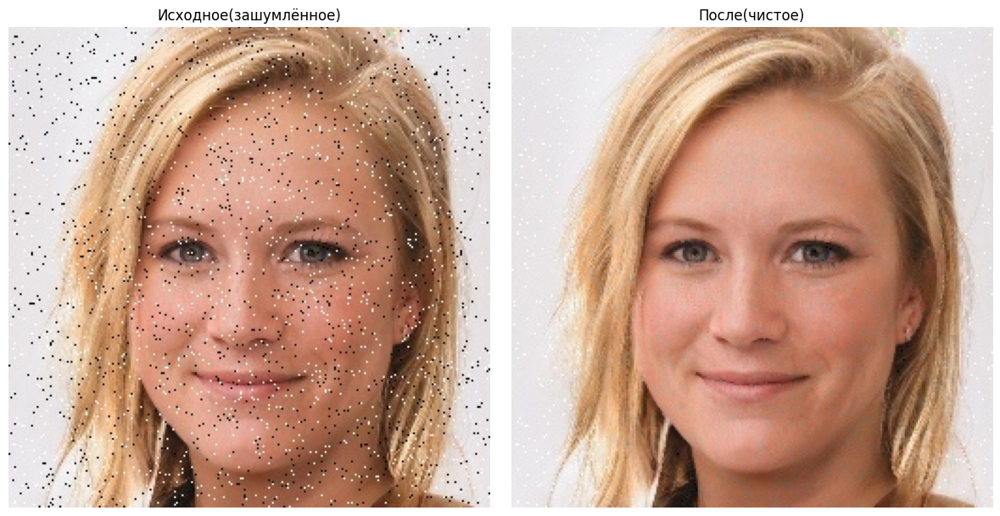

In [33]:
image_path = "./dataset/train_images/2.jpg"

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


clean_image = remove_salt_and_pepper(image)
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Исходное(зашумлённое)")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(clean_image)
plt.title("После(чистое)")
plt.axis("off")

plt.tight_layout()
plt.show()

### Получили хороший результат. Будем использовать этот метод

In [34]:
# заменяем грязные на чистые
train_data_path = "./new_dataset/train_dataset"
test_data_path = "./new_dataset/test_dataset"
original_test_path = "./dataset/test_images/"
original_test_clean_path = "./dataset/clean_test_images/"

# Если в new_dataset нет чистых изображений
if input() == "ДА":
    for root_path in [train_data_path, test_data_path]:
        for dir in ["/1/", "/0/"]:
            for image in os.listdir(root_path + dir):
                current_image_path = root_path + dir + image
                image = cv2.imread(current_image_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                clean_image = remove_salt_and_pepper(image)
                clean_image = Image.fromarray(clean_image)
                clean_image.save(current_image_path)
                
    if "clean_test_images" not in os.listdir("./dataset"):
        os.mkdir(original_test_clean_path)
        
        for image_path in os.listdir(original_test_path):
            current_image_path = original_test_path + image_path
            image = cv2.imread(current_image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            clean_image = remove_salt_and_pepper(image)
            clean_image = Image.fromarray(clean_image)
            clean_image.save(original_test_clean_path + image_path)

In [67]:
train_data_path = "./dataset90/train_dataset"
test_data_path = "./dataset90/test_dataset"


# Если в dataset90 нет чистых изображений
if input() == "ДА":
    for root_path in [train_data_path, test_data_path]:
        for dir in ["/1/", "/0/"]:
            for image in os.listdir(root_path + dir):
                current_image_path = root_path + dir + image
                image = cv2.imread(current_image_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                clean_image = remove_salt_and_pepper(image)
                clean_image = Image.fromarray(clean_image)
                clean_image.save(current_image_path)
                


# Решение проблемы с дисбалансом классов

In [35]:
def show_train_test_datasets(train_path: str, test_path: str) -> None:
    print("---------TRAIN---------")
    print("real:", len(os.listdir(train_path + "/0")))
    print("fake:", len(os.listdir(train_path + "/1")))
    print("---------TEST---------")
    print("real:", len(os.listdir(test_path + "/0")))
    print("fake:", len(os.listdir(test_path + "/1")))
    
show_train_test_datasets(train_data_path, test_data_path)

---------TRAIN---------
real: 33200
fake: 33200
---------TEST---------
real: 8300
fake: 1700


#### Увеличиваем меньший класс

In [36]:
import random
from typing import List


def balance_deepfake_dataset(real_path: str, deepfake_path: str) -> None:
    real_count = len([
        f for f in os.listdir(real_path)])
    
    files = os.listdir(deepfake_path)

    # оригиналы 
    originals = [
        f for f in files
        if not (f.startswith("flip_") or 
                f.startswith("affine_") or 
                f.startswith("light_") or 
                f.startswith("all_"))
        ]

    print(f"Оригинальных fake: {len(originals)}")
    print(f"Количество real: {real_count}")

    # аугментации
    
    flip_transform = transforms.RandomHorizontalFlip(p=1.0)
    affine_transform = transforms.RandomAffine(
        degrees=5,
        translate=(0.1, 0.1),
        scale=(0.9, 1.1),
    )
    light_transform = transforms.ColorJitter(
        brightness=0.25,
        contrast=0.25,
        saturation=0.25,
    )

    all_transform = transforms.Compose([flip_transform, affine_transform, light_transform])
    
    # создаём по одной копии каждой аугментации
    for img_file in originals:
        img_path = os.path.join(deepfake_path, img_file)
        img = Image.open(img_path).convert("RGB")

        # flip
        flip_name = "flip_" + img_file
        if flip_name not in files:
            flip_transform(img).save(os.path.join(deepfake_path, flip_name))

        # affine
        affine_name = "affine_" + img_file
        if affine_name not in files:
            affine_transform(img).save(os.path.join(deepfake_path, affine_name))

        # light
        light_name = "light_" + img_file
        if light_name not in files:
            light_transform(img).save(os.path.join(deepfake_path, light_name))
        
        # all
        all_name = "all_" + img_file
        if all_name not in files:
            all_transform(img).save(os.path.join(deepfake_path, all_name))
            
    def list_images() -> List:
        return [f for f in os.listdir(deepfake_path)]
    
    
    def random_transform(img_path: str) -> Tuple:
        augmentations = [["flip_", flip_transform], 
                         ["affine", affine_transform], 
                         ["light_", light_transform], 
                         ["all_", all_transform]]
        
        prefix, augmentation = random.choice(augmentations)
        img = Image.open(img_path).convert('RGB')
        return (prefix, augmentation(img))
    
    # считаем после аугментаций
    current_deepfake = len(list_images())
    need_add = current_deepfake - real_count

    print(f"\nПосле аугментаций deepfake = {current_deepfake} (real = {real_count})")

    # если у нас кол-во deepfake > real
    if need_add > 0:
        for_delete = [
            f for f in list_images()
            if f.startswith(("flip_", "affine_", "light_", "all_"))]

        # уменьшаем diff, если аугментаций меньше
        need_add = min(need_add, len(for_delete))

        to_delete = random.sample(for_delete, need_add)
        for f in to_delete:
            os.remove(os.path.join(deepfake_path, f))

        print(f"Удалено файлов: {len(to_delete)}")
    
    elif need_add < 0:
        image_list_for_aug = random.choices(list_images(), k=abs(need_add))
        for img_file in image_list_for_aug:
            img_path = os.path.join(deepfake_path, img_file)
            prefix, augmented_img = random_transform(img_path)
            augmented_name = prefix + img_file
            augmented_img.save(os.path.join(deepfake_path, augmented_name))


    print(f"\nИтоговое количество deepfake = {len(list_images())}")


In [37]:

if not(len(os.listdir(train_data_path + "/0")) == len(os.listdir(train_data_path + "/1"))):
    balance_deepfake_dataset(
        real_path="./new_dataset/train_dataset/0",
        deepfake_path="./new_dataset/train_dataset/1"
    )
else:
    show_train_test_datasets(train_data_path, test_data_path)

---------TRAIN---------
real: 33200
fake: 33200
---------TEST---------
real: 8300
fake: 1700


In [38]:

test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5194, 0.4280, 0.3847], std=[0.2861, 0.2640, 0.2636]),
])

train_dataset = ImageFolder(train_data_path, transform=train_transform)
print(train_dataset.classes)
print(train_dataset[0][0].shape)

test_dataset = ImageFolder(test_data_path, transform=test_transform)
val_dataset, test_dataset = random_split(test_dataset, [0.5, 0.5])




['0', '1']
torch.Size([3, 256, 256])


#### Взвешивание классов

In [39]:
from typing import Dict


AUG_SUFFIXES = [
    "flip",
    "affine",
    "light",
    "all"
]

def count_original_images(root_dir: str) -> Dict:
    class_counts = {}
    
    for class_name in os.listdir(root_dir):
        class_path = os.path.join(root_dir, class_name)
        
        count = 0
        for filename in os.listdir(class_path):
            name, ext = os.path.splitext(filename)
            if ext.lower() == ".jpg":
                # Проверяем, что имя НЕ содержит суффиксов аугментации
                if not any(suffix in name for suffix in AUG_SUFFIXES):
                    count += 1
        
        class_counts[class_name] = count
    
    return class_counts

counts = count_original_images(train_data_path)
print("Оригинальное распределение классов:", counts)


Оригинальное распределение классов: {'0': 33200, '1': 6800}


In [40]:
from sklearn.utils.class_weight import compute_class_weight

classes = ["0", "1"]
y_original = []

# имитируем радоту ImageFolder (собираем все метки label в список)
for class_idx, class_name in enumerate(classes):
    y_original += [class_idx] * counts[class_name]

class_weights = compute_class_weight(
    class_weight='balanced', 
    classes=np.unique(y_original), 
    y=y_original
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float32).to(device)
print(f"Веса классов: {class_weights_tensor}")
# loss_function = nn.CrossEntropyLoss(weight=class_weights)

Веса классов: tensor([0.6024, 2.9412], device='cuda:0')


In [ ]:
from collections import Counter
from torch.utils.data import DataLoader, WeightedRandomSampler

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)
weights = [1.0 / class_counts[label] for label in labels]

sampler = WeightedRandomSampler(
    weights=weights,           
    num_samples=len(labels),   
    replacement=True           
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler)

Counter({0: 33200, 1: 33200})


In [44]:
import csv
import os

def result_csv(model: nn.Module, noisy: bool = True) -> None:

    preprocess = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5194, 0.4280, 0.3847], std=[0.2861, 0.2640, 0.2636]),
    ])

    model = model.to(device)
    predicts = []
    
    if noisy:
        data_path = "./dataset/test_images/"
    else:
        data_path = "./dataset/clean_test_images/"
        
    for image_num in os.listdir(data_path):
        image_path = data_path + image_num
        image = Image.open(image_path)
        image_tensor = preprocess(image)
        image_tensor = image_tensor.unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(image_tensor)
            predicts.append([int(image_num.split('.')[0]), int(torch.argmax(output))])

    print(len(predicts))
    print(predicts)
    result = [['id', "target_feature"]] + sorted(predicts)
    with open('result.csv', 'w') as csv_file:
        writer = csv.writer(csv_file)
        writer.writerows(result)

### Функции для обучения моделей

In [45]:
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score
from torch import optim

def run(
    model: nn.Module,
    dataloader: DataLoader,
    loss_function,
    optimizer: optim.Optimizer = None
) -> Tuple[float, float, float]:

    if optimizer is None:
        model.eval()
        torch.set_grad_enabled(False)
    else:
        model.train()
        torch.set_grad_enabled(True)

    total_loss = 0
    predicts = []
    labels = []

    for X, y in tqdm(dataloader):
        X = X.to(device)
        y = y.to(device)

        logits = model(X)

        loss = loss_function(logits, y)
        total_loss += loss.item()

        preds = logits.argmax(dim=1)

        predicts.extend(preds.cpu().numpy())
        labels.extend(y.cpu().numpy())

        if optimizer is not None:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

    return (
        total_loss / len(dataloader),
        accuracy_score(labels, predicts),
        f1_score(labels, predicts)
    )



In [46]:
from IPython.display import clear_output

def show_losses(train_loss_hist: list, validate_loss_hist: list, train_accuracy_hist: list, 
                validate_accuracy_hist: list, train_f1: list, val_f1: list) -> None:
    clear_output()

    plt.figure(figsize=(15,8))
    columns = 5

    plt.subplot(1, columns, 1)
    plt.title('Train Loss')
    plt.plot(np.arange(len(train_loss_hist)), train_loss_hist)
    plt.yscale('log')
    plt.grid()

    plt.subplot(1, columns, 2)
    plt.title('Validate Loss')
    plt.plot(np.arange(len(validate_loss_hist)), validate_loss_hist)
    plt.yscale('log')
    plt.grid()

    plt.subplot(1, columns, 3)
    plt.title('Validate and Train Loss')
    plt.plot(np.arange(len(train_loss_hist)), train_loss_hist, color='blue', label='train')
    plt.plot(np.arange(len(validate_loss_hist)), validate_loss_hist, color='red', label='validate')
    plt.yscale('log')
    plt.grid()
    plt.legend()

    plt.subplot(1, columns, 4)
    plt.plot(train_accuracy_hist, label='Train accuracy')
    plt.plot(validate_accuracy_hist, label='Valid accuracy')
    plt.grid()
    plt.legend()

    plt.subplot(1, columns, 5)
    plt.plot(train_f1, label='Train f1')
    plt.plot(val_f1, label='Valid f1')
    plt.grid()
    plt.legend()

    plt.show()

In [47]:
def train(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    num_epochs: int,
    optimizer,
    loss_function=None,
    save_name: str = 'new_model_best_f1.pth'
):

    if loss_function is None:
        loss_function = nn.CrossEntropyLoss()

    train_loss_hist = []
    val_loss_hist = []
    train_accuracy_hist = []
    val_accuracy_hist = []
    train_f1_hist = []
    val_f1_hist = []

    model.to(device)
    best_f1 = 0.0

    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs}")

        train_loss, train_acc, train_f1 = run(
            model, train_loader, loss_function, optimizer
        )

        val_loss, val_acc, val_f1 = run(
            model, val_loader, loss_function
        )

        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)
        train_accuracy_hist.append(train_acc)
        val_accuracy_hist.append(val_acc)
        train_f1_hist.append(train_f1)
        val_f1_hist.append(val_f1)

        show_losses(
            train_loss_hist,
            val_loss_hist,
            train_accuracy_hist,
            val_accuracy_hist,
            train_f1_hist,
            val_f1_hist
        )

        if val_f1 > best_f1:
            best_f1 = val_f1
            torch.save(model.state_dict(), save_name)
            print(f"Модель сохранена: F1 = {best_f1:.4f}")

    torch.save(model.state_dict(), "last_model.pth")


In [48]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
import seaborn as sns


def statistic(model: nn.Module, test_loader: DataLoader) -> Tuple[list, list]:
    """
    
    Функция которая принимает модель, и тестовую выборку, возвращает true label и предсказание модели
    
    """
    predicts = []
    targets = []

    model.to('cpu')
    with torch.no_grad():
        for X, y in test_loader:
            predicts.append(torch.argmax(model(X).to(device)).item())
            targets.append(y)


    accuracy = accuracy_score(predicts, targets)
    precision = precision_score(targets, predicts)
    recall = recall_score(targets, predicts)
    f1 = f1_score(targets, predicts)
    roc_auc = roc_auc_score(targets, predicts)
    print(f'{accuracy=}')
    print(f'{precision=}')
    print(f'{recall=}')
    print(f'{f1=}')
    print(f'{roc_auc=}')
    
    # Матрица ошибок

    cm = confusion_matrix(targets, predicts)
    sns.heatmap(cm, annot=True, fmt='d')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()
    
    return targets, predicts


In [49]:
from torchvision.datasets import ImageFolder
from torch.utils.data import random_split

train_data_path = 'new_dataset/train_dataset'
test_data_path = 'new_dataset/test_dataset'

train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(
                    degrees=10,  # поворот
                    translate=(0.05, 0.05),  # смещение изображения 
                    scale=(0.9, 1.1),  # маштобирование
                ),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.Normalize(mean=[0.5194, 0.4280, 0.3847], std=[0.2861, 0.2640, 0.2636]),
])


test_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5194, 0.4280, 0.3847], std=[0.2861, 0.2640, 0.2636]),
])

train_dataset = ImageFolder(train_data_path, transform=train_transform)
print(train_dataset.classes)
print(train_dataset[0][0].shape)

test_dataset = ImageFolder(test_data_path, transform=test_transform)
val_dataset, test_dataset = random_split(test_dataset, [0.5, 0.5])

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset)
print(len(train_dataset))

['0', '1']
torch.Size([3, 256, 256])
66400


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6803281..1.8351048].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8004869..2.2387605].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8154491..2.3342185].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8154491..2.3342185].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7384822..1.81274].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8154491..2.3342185].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7579681.

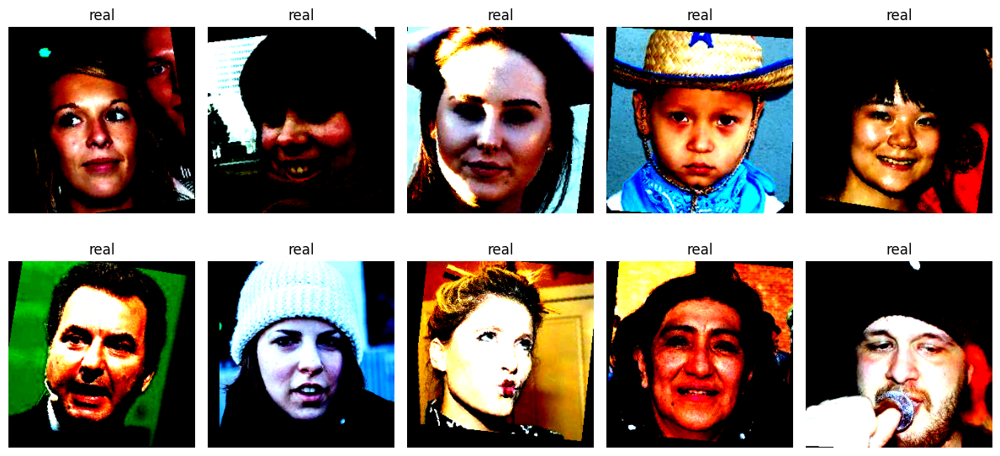

In [50]:
import random

train_classes = ["real", "fake"]
plt.figure(figsize=(12, 6))

for i in range(10):
    plt.subplot(2, 5, i + 1)
    image, label = train_dataset[i]
    image = image.numpy().transpose(1, 2, 0)
    plt.imshow(image)
    plt.title(f'{"fake" if label == 1 else "real"}')
    plt.axis(False)
plt.tight_layout()
plt.show()

#### Без аугментации

#### модель, без аугментации, без решения дисбалансов класса, без удаления шума

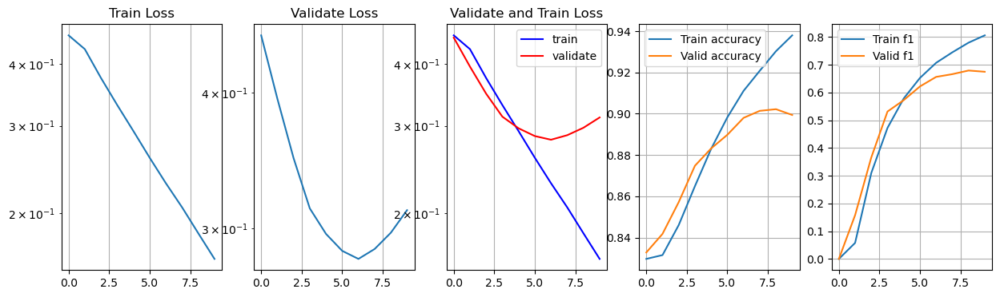

Полседняя Модель сохранена:  {0.8994}
min_val_loss=0.2811892532472369
min_train_loss=0.1617808173060417
accuracy=0.9036
precision=0.7551867219917012
recall=0.6415981198589894
f1=0.6937738246505718
roc_auc=0.7994686188593574


(0.9036,
 0.7551867219917012,
 0.6415981198589894,
 0.6937738246505718,
 0.7994686188593574)

In [ ]:
num_epochs = 10
train(model, train_loader, val_loader, num_epochs)
statistic(model, test_loader)

In [ ]:
statistic(model, test_loader)

accuracy=0.9036
precision=0.7551867219917012
recall=0.6415981198589894
f1=0.6937738246505718
roc_auc=0.7994686188593574


(0.9036,
 0.7551867219917012,
 0.6415981198589894,
 0.6937738246505718,
 0.7994686188593574)

#### модель, без аугментации, без решения дисбалансов класса, без удаления шума, но с измененными весами классов

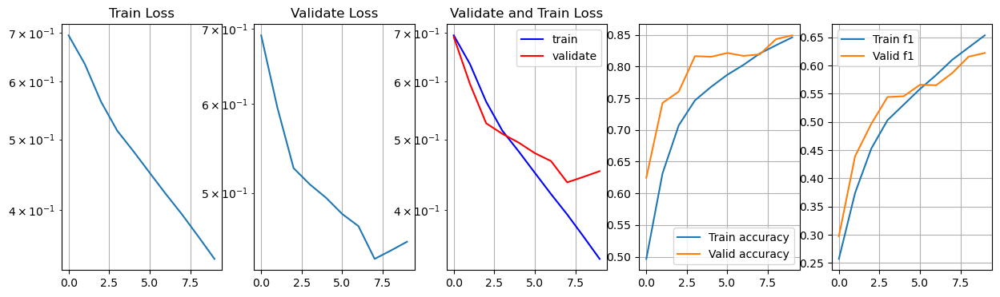

Модель сохранена:  {0.8492}
Полседняя Модель сохранена:  {0.8492}
min_val_loss=0.43670531739569635
min_train_loss=0.3430687401865894
accuracy=0.8434
precision=0.5285234899328859
recall=0.7403055229142186
f1=0.6167400881057269
roc_auc=0.8024255982852607


(0.8434,
 0.5285234899328859,
 0.7403055229142186,
 0.6167400881057269,
 0.8024255982852607)

In [ ]:
loss_function = nn.CrossEntropyLoss(weight=torch.tensor(class_weights).to(device))
num_epochs = 10
train(class_weight_model, train_loader, val_loader, num_epochs, loss_function=loss_function)
statistic(class_weight_model, test_loader)

# простая свёрточная сеть

## модель, без аугментации, без решения дисбалансов класса, без удаления шума

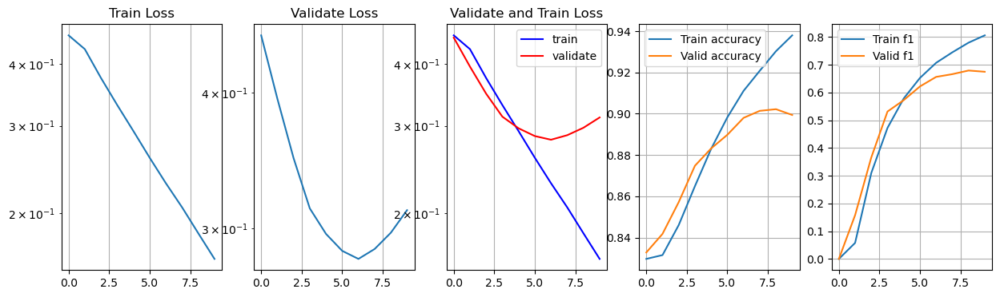

Полседняя Модель сохранена:  {0.8994}
min_val_loss=0.2811892532472369
min_train_loss=0.1617808173060417
accuracy=0.9036
precision=0.7551867219917012
recall=0.6415981198589894
f1=0.6937738246505718
roc_auc=0.7994686188593574


(0.9036,
 0.7551867219917012,
 0.6415981198589894,
 0.6937738246505718,
 0.7994686188593574)

In [ ]:
num_epochs = 10
train(model, train_loader, val_loader, num_epochs)
statistic(model, test_loader)

In [ ]:
from collections import Counter
from torch.utils.data import DataLoader, WeightedRandomSampler

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)


train_loader = DataLoader(train_dataset, batch_size=batch_size)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset)

Counter({0: 33200, 1: 6800})


## модель, без аугментации, без решения дисбалансов класса, без удаления шума, но с измененными весами классов

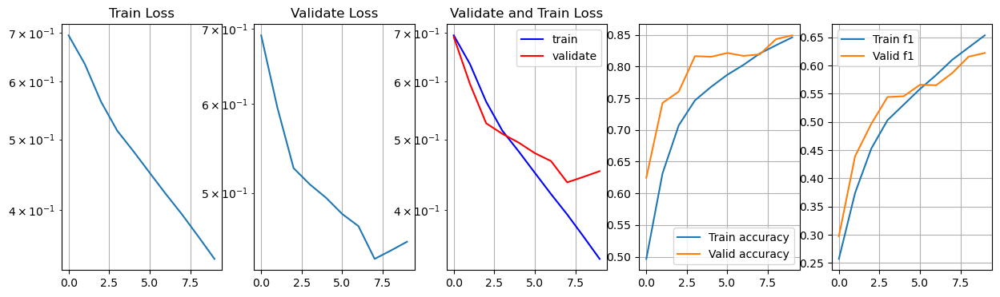

Модель сохранена:  {0.8492}
Полседняя Модель сохранена:  {0.8492}
min_val_loss=0.43670531739569635
min_train_loss=0.3430687401865894
accuracy=0.8434
precision=0.5285234899328859
recall=0.7403055229142186
f1=0.6167400881057269
roc_auc=0.8024255982852607


(0.8434,
 0.5285234899328859,
 0.7403055229142186,
 0.6167400881057269,
 0.8024255982852607)

In [ ]:
loss_function = nn.CrossEntropyLoss(weight=torch.tensor(class_weights).to(device))
num_epochs = 10
train(class_weight_model, train_loader, val_loader, num_epochs, loss_function=loss_function)
statistic(class_weight_model, test_loader)

## CNN и WeightedRandomSampler + Аугментация

In [ ]:
from collections import Counter
from torch.utils.data import DataLoader, WeightedRandomSampler

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)
weights = [1.0 / class_counts[label] for label in labels]

sampler = WeightedRandomSampler(
    weights=weights,           
    num_samples=len(labels),   
    replacement=True           
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset)

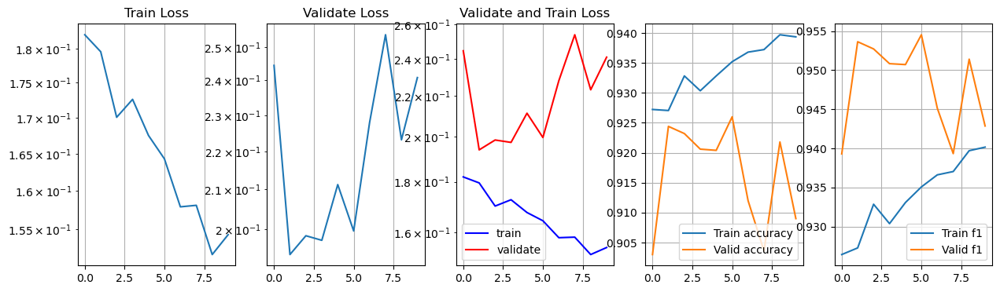

Полседняя Модель сохранена:  {0.909}
min_val_loss=0.1939246011008123
min_train_loss=0.1518405393704772


In [ ]:
train(class_weight_model, train_loader, val_loader, 10)
# здесь на графике последние 10 эпох, обучал я 30
# метрики f1 к классу реальных лиц

# ResNet18

# ResNet18 + шум

In [ ]:
show_train_test_datasets("./noisy_dataset/train_dataset", "./noisy_dataset/test_dataset")

---------TRAIN---------
real: 33200
fake: 33200
---------TEST---------
real: 8300
fake: 1700


In [ ]:
if len(os.listdir("./noisy_dataset/train_dataset/0")) != len(os.listdir("./noisy_dataset/test_dataset/1")):
    balance_deepfake_dataset(real_path="./noisy_dataset/train_dataset/0", deepfake_path="./noisy_dataset/train_dataset/1")
else:
    show_train_test_datasets("./noisy_dataset/train_dataset", "./noisy_dataset/test_dataset")

Оригинальных fake: 6800
Количество real: 33200

После аугментаций deepfake = 34000 (real = 33200)
Удалено файлов: 800

Итоговое количество deepfake = 33200


In [ ]:
show_train_test_datasets("./noisy_dataset/train_dataset", "./noisy_dataset/test_dataset")

---------TRAIN---------
real: 33200
fake: 33200
---------TEST---------
real: 8300
fake: 1700


In [53]:
train_dataset = ImageFolder("noisy_dataset/train_dataset", transform=train_transform)
test_dataset = ImageFolder("noisy_dataset/test_dataset", transform=test_transform)

val_dataset, test_dataset = random_split(test_dataset, [0.5, 0.5])

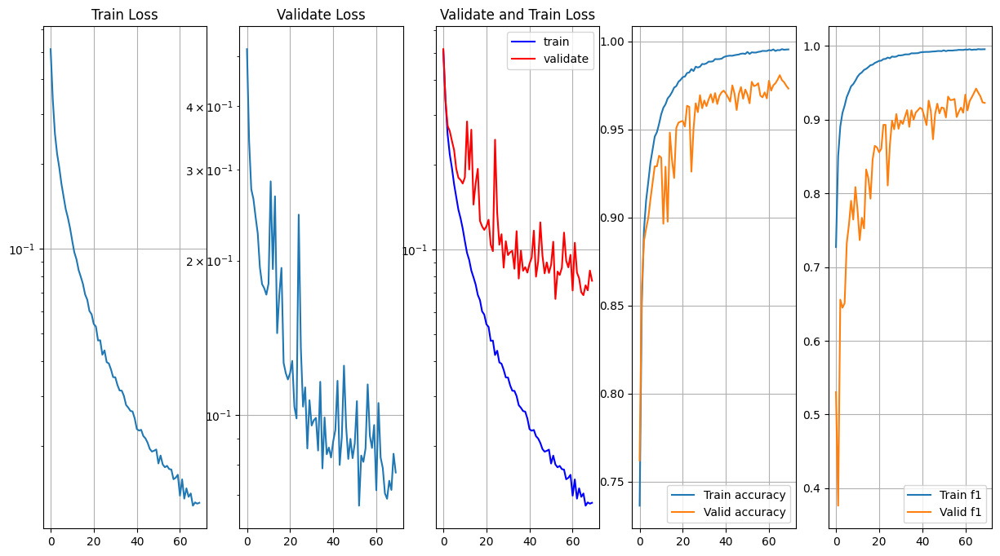

Последняя Модель сохранена:  {0.9732}
min_val_loss=0.06669786321106783
min_train_loss=0.01228128640300197


In [ ]:
from collections import Counter
from torch.utils.data import DataLoader

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)

train_loader = DataLoader(train_dataset, batch_size=batch_size)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset)

optimizer = optim.Adam(resnet18.parameters(), lr=0.0001)
train(resnet18, train_loader, val_loader, 70, optimizer=optimizer, save_name="ResNet_18_noisy_image_weights.pth")

In [ ]:
resnet18 = ResNet18()
resnet18.load_state_dict(torch.load("ResNet_18_noisy_image_weights.pth"))

C:\Users\SyFL3sHkA\AppData\Local\Temp\ipykernel_14616\3802119761.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet18.load_state_dict(torch.load("ResNet_18_noisy_ima

<All keys matched successfully>

### Случайно запустили функцию обучения с именем файла как у ResNet_18 (великий ctrl+c ctrl+v) по этому матрциа ошибок не настоящая

accuracy=0.6136
precision=0.3047550432276657
recall=0.9976415094339622
f1=0.46688741721854304
roc_auc=0.7664026429636093


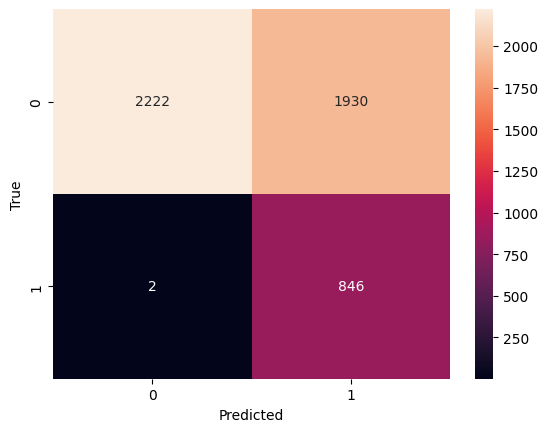

In [73]:
y_true, y_pred = statistic(resnet18, test_loader)
from sklearn.metrics import confusion_matrix
import seaborn as sns


cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [57]:
result_csv(resnet18)

10000
[[0, 1], [1, 1], [10, 0], [100, 0], [1000, 0], [1001, 0], [1002, 0], [1003, 1], [1004, 1], [1005, 1], [1006, 0], [1007, 0], [1008, 1], [1009, 0], [101, 0], [1010, 0], [1011, 0], [1012, 0], [1013, 1], [1014, 0], [1015, 0], [1016, 1], [1017, 0], [1018, 1], [1019, 0], [102, 1], [1020, 1], [1021, 1], [1022, 1], [1023, 0], [1024, 1], [1025, 0], [1026, 0], [1027, 1], [1028, 0], [1029, 0], [103, 0], [1030, 0], [1031, 0], [1032, 1], [1033, 1], [1034, 0], [1035, 0], [1036, 0], [1037, 1], [1038, 1], [1039, 1], [104, 0], [1040, 1], [1041, 0], [1042, 1], [1043, 0], [1044, 0], [1045, 0], [1046, 1], [1047, 1], [1048, 0], [1049, 1], [105, 0], [1050, 1], [1051, 0], [1052, 0], [1053, 1], [1054, 1], [1055, 1], [1056, 0], [1057, 1], [1058, 0], [1059, 0], [106, 1], [1060, 1], [1061, 1], [1062, 1], [1063, 0], [1064, 0], [1065, 1], [1066, 1], [1067, 1], [1068, 1], [1069, 1], [107, 1], [1070, 0], [1071, 0], [1072, 0], [1073, 0], [1074, 1], [1075, 1], [1076, 1], [1077, 0], [1078, 1], [1079, 0], [108, 0]

# ResNet18 + чистые изображения

### опять был случайный запуск, по этому графики не сохранились, но рекодного скора не было

In [ ]:
from collections import Counter
from torch.utils.data import DataLoader

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)


train_loader = DataLoader(train_dataset, batch_size=batch_size)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset)

optimizer = optim.Adam(resnet18.parameters(), lr=0.0001)
train(resnet18, train_loader, val_loader, 50, optimizer=optimizer, save_name="ResNet_18_clean_images.pth")

## ResNet18 + шум + WRS + Aугментация 

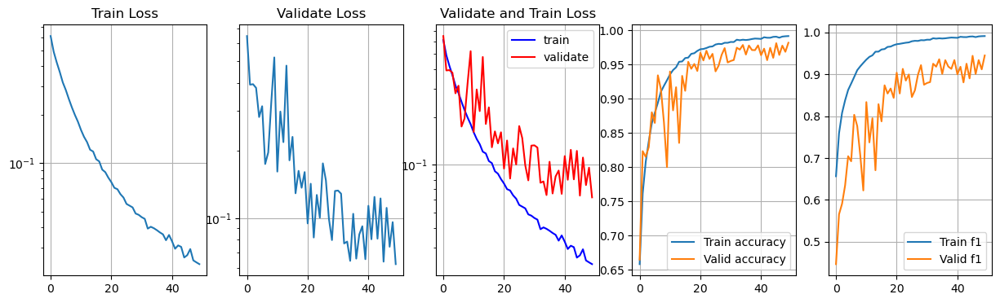

Модель сохранена:  {0.9816}
Полседняя Модель сохранена:  {0.9816}
min_val_loss=0.0622918203957707
min_train_loss=0.023626409387149033


In [ ]:
from collections import Counter
from torch.utils.data import DataLoader, WeightedRandomSampler

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)
weights = [1.0 / class_counts[label] for label in labels]

sampler = WeightedRandomSampler(
    weights=weights,           
    num_samples=len(labels),   
    replacement=True           
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset)

optimizer = optim.Adam(resnet18.parameters(), lr=0.0001)
train(resnet18, train_loader, val_loader, 50, optimizer=optimizer)

accuracy=0.9856
precision=0.9768009768009768
recall=0.9378663540445487
f1=0.9569377990430622
roc_auc=0.9666423643866341


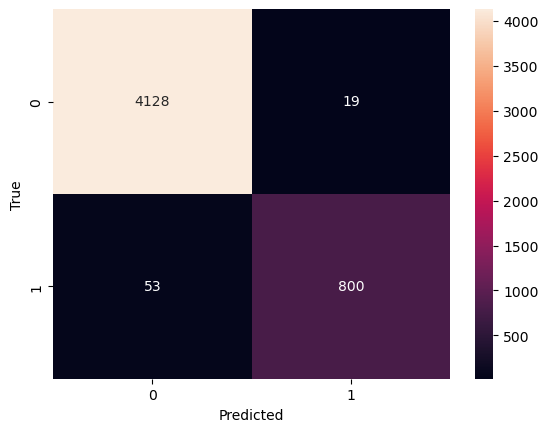

In [ ]:
y_true, y_pred = statistic(resnet18, test_loader)
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

## Учим модель сначало на шум, потом на чистых изображениях resnet18

### Шум

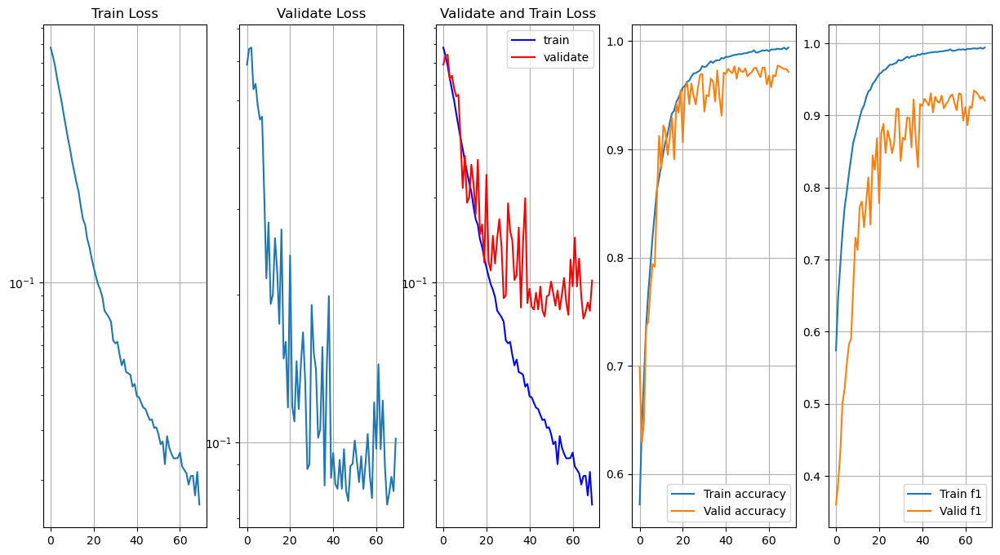

Последняя Модель сохранена:  {0.9716}
min_val_loss=0.0745918330779836
min_train_loss=0.016361958856182173


In [ ]:
from collections import Counter
from torch.utils.data import DataLoader, WeightedRandomSampler

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)
weights = [1.0 / class_counts[label] for label in labels]

sampler = WeightedRandomSampler(
    weights=weights,           
    num_samples=len(labels),   
    replacement=True           
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, pin_memory=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, pin_memory=True, num_workers=4)
test_loader = DataLoader(test_dataset)

optimizer = optim.Adam(resnet18.parameters(), lr=0.0003)
train(resnet18, train_loader, val_loader, 70, optimizer=optimizer, save_name='resnet18-noise-WRS.pth')

accuracy=0.9318
precision=0.7433366238894373
recall=0.9028776978417267
f1=0.8153762858689767
roc_auc=0.9202338561220156


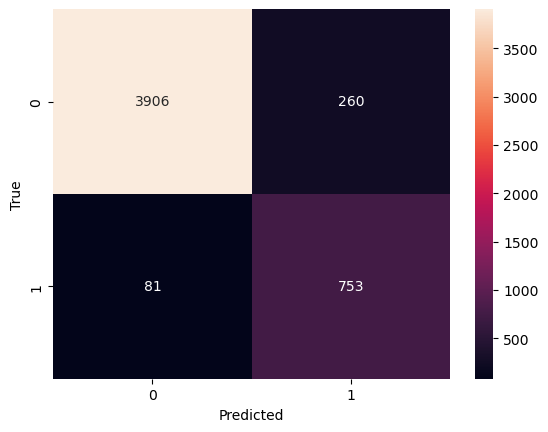

10000
[[0, 1], [1, 0], [10, 0], [100, 0], [1000, 0], [1001, 0], [1002, 0], [1003, 1], [1004, 1], [1005, 1], [1006, 1], [1007, 0], [1008, 1], [1009, 0], [101, 0], [1010, 0], [1011, 0], [1012, 0], [1013, 1], [1014, 0], [1015, 0], [1016, 1], [1017, 0], [1018, 1], [1019, 0], [102, 0], [1020, 0], [1021, 1], [1022, 1], [1023, 0], [1024, 1], [1025, 0], [1026, 0], [1027, 1], [1028, 0], [1029, 1], [103, 0], [1030, 0], [1031, 0], [1032, 1], [1033, 1], [1034, 0], [1035, 0], [1036, 0], [1037, 1], [1038, 0], [1039, 1], [104, 0], [1040, 1], [1041, 0], [1042, 1], [1043, 0], [1044, 0], [1045, 0], [1046, 1], [1047, 1], [1048, 0], [1049, 1], [105, 0], [1050, 0], [1051, 0], [1052, 0], [1053, 1], [1054, 1], [1055, 1], [1056, 0], [1057, 1], [1058, 0], [1059, 0], [106, 1], [1060, 1], [1061, 1], [1062, 1], [1063, 1], [1064, 0], [1065, 1], [1066, 1], [1067, 1], [1068, 1], [1069, 1], [107, 1], [1070, 0], [1071, 0], [1072, 0], [1073, 0], [1074, 1], [1075, 1], [1076, 1], [1077, 0], [1078, 1], [1079, 0], [108, 0]

In [ ]:
resnet18.load_state_dict(torch.load('resnet18-noise-WRS'))
resnet18 = resnet18.to(device)
statistic(resnet18, test_loader)
result_csv(resnet18)


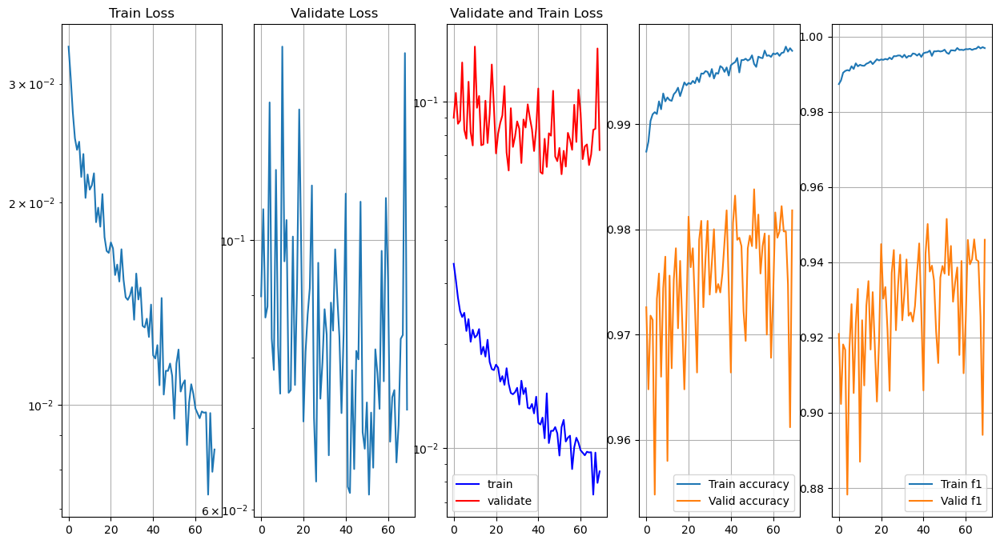

Последняя Модель сохранена:  {0.9818}
min_val_loss=0.06175041426377572
min_train_loss=0.007353558247002365


In [ ]:
from torchvision.datasets import ImageFolder
from torch.utils.data import random_split

# ---------without noise----------
train_data_path = 'new_dataset/train_dataset'
test_data_path = 'new_dataset/test_dataset'

train_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(
                    degrees=10,  # поворот
                    translate=(0.05, 0.05),  # смещение изображения 
                    scale=(0.9, 1.1),  # маштобирование
                ),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.Normalize(mean=[0.5194, 0.4280, 0.3847], std=[0.2861, 0.2640, 0.2636]),
])


test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5194, 0.4280, 0.3847], std=[0.2861, 0.2640, 0.2636]),
])

train_dataset = ImageFolder(train_data_path, transform=train_transform)
test_dataset = ImageFolder(test_data_path, transform=test_transform)
val_dataset, test_dataset = random_split(test_dataset, [0.5, 0.5])

# -----------------------------------------------

from collections import Counter
from torch.utils.data import DataLoader, WeightedRandomSampler

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)
weights = [1.0 / class_counts[label] for label in labels]

sampler = WeightedRandomSampler(
    weights=weights,           
    num_samples=len(labels),   
    replacement=True           
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, pin_memory=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, pin_memory=True, num_workers=4)
test_loader = DataLoader(test_dataset)

optimizer = optim.Adam(resnet18.parameters(), lr=0.0001)
train(resnet18, train_loader, val_loader, 70, optimizer=optimizer, save_name='resnet18-noise-clear-WRS.pth')

dirty_dataset/train_dataset
accuracy=0.957
precision=0.8506981740064447
recall=0.9124423963133641
f1=0.8804891606448026
roc_auc=0.9394012562399346


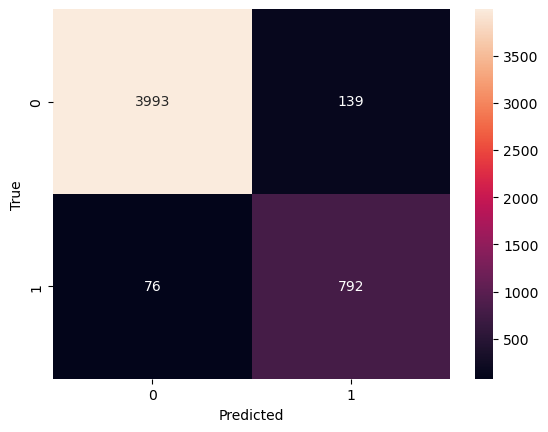

10000
[[0, 1], [1, 1], [10, 0], [100, 0], [1000, 0], [1001, 0], [1002, 0], [1003, 1], [1004, 1], [1005, 1], [1006, 0], [1007, 0], [1008, 1], [1009, 0], [101, 0], [1010, 0], [1011, 0], [1012, 0], [1013, 1], [1014, 0], [1015, 1], [1016, 1], [1017, 0], [1018, 1], [1019, 0], [102, 0], [1020, 0], [1021, 1], [1022, 1], [1023, 0], [1024, 1], [1025, 0], [1026, 0], [1027, 1], [1028, 0], [1029, 0], [103, 0], [1030, 1], [1031, 0], [1032, 1], [1033, 1], [1034, 0], [1035, 0], [1036, 0], [1037, 1], [1038, 1], [1039, 1], [104, 0], [1040, 1], [1041, 0], [1042, 1], [1043, 0], [1044, 0], [1045, 0], [1046, 1], [1047, 1], [1048, 0], [1049, 1], [105, 0], [1050, 1], [1051, 0], [1052, 0], [1053, 1], [1054, 1], [1055, 1], [1056, 0], [1057, 1], [1058, 0], [1059, 0], [106, 1], [1060, 1], [1061, 1], [1062, 1], [1063, 1], [1064, 0], [1065, 1], [1066, 1], [1067, 1], [1068, 1], [1069, 1], [107, 1], [1070, 0], [1071, 0], [1072, 0], [1073, 0], [1074, 1], [1075, 1], [1076, 1], [1077, 0], [1078, 1], [1079, 0], [108, 0]

In [ ]:
print(train_data_path)
resnet18.load_state_dict(torch.load('resnet18-noise-clear-WRS.pth'))
resnet18 = resnet18.to(device)
statistic(resnet18, test_loader)
result_csv(resnet18)


# UNet для классификации

In [49]:
summary(UNet_with_WRS_model)

Layer (type:depth-idx)                   Param #
UNetForClassification                    --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       896
│    └─ReLU: 2-2                         --
│    └─BatchNorm2d: 2-3                  64
│    └─Conv2d: 2-4                       9,248
│    └─ReLU: 2-5                         --
├─MaxPool2d: 1-2                         --
├─Sequential: 1-3                        --
│    └─Conv2d: 2-6                       18,496
│    └─ReLU: 2-7                         --
│    └─BatchNorm2d: 2-8                  128
│    └─Conv2d: 2-9                       36,928
│    └─ReLU: 2-10                        --
├─MaxPool2d: 1-4                         --
├─Sequential: 1-5                        --
│    └─Conv2d: 2-11                      73,856
│    └─ReLU: 2-12                        --
│    └─BatchNorm2d: 2-13                 256
│    └─Conv2d: 2-14                      147,584
│    └─ReLU: 2-15                        --
├─Ma

In [ ]:
from collections import Counter
from torch.utils.data import DataLoader


labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)


train_loader = DataLoader(
    train_dataset, batch_size=batch_size)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset)

Counter({0: 33200, 1: 33200})


In [ ]:
train(model=UNet_with_WRS_model, train_loader=train_loader, val_loader=val_loader, num_epochs=30, save_name="UNet_model_weights.pth")
statistic(UNet_with_WRS_model, test_loader)

accuracy=0.9568
precision=0.935672514619883
recall=0.7881773399014779
f1=0.8556149732620321
roc_auc=0.8888355658437666


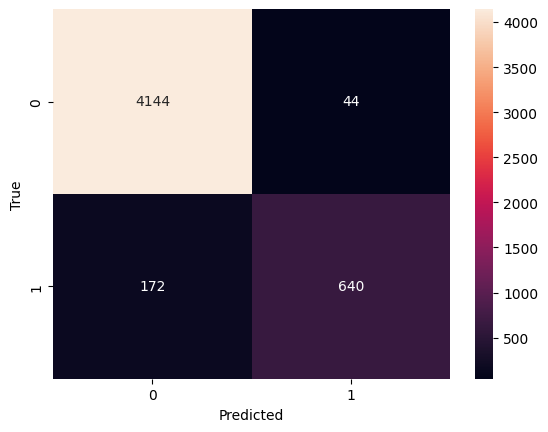

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix


UNet_with_WRS_model.load_state_dict(
    torch.load('UNet_model_weights.pth'))
y_true, y_pred = statistic(UNet_with_WRS_model, test_loader)

cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

### С шумными данными

# Inception V1

In [97]:
train_dataset = ImageFolder("noisy_dataset/train_dataset", transform=train_transform)
test_dataset = ImageFolder("noisy_dataset/test_dataset", transform=test_transform)

val_dataset, test_dataset = random_split(test_dataset, [0.5, 0.5])

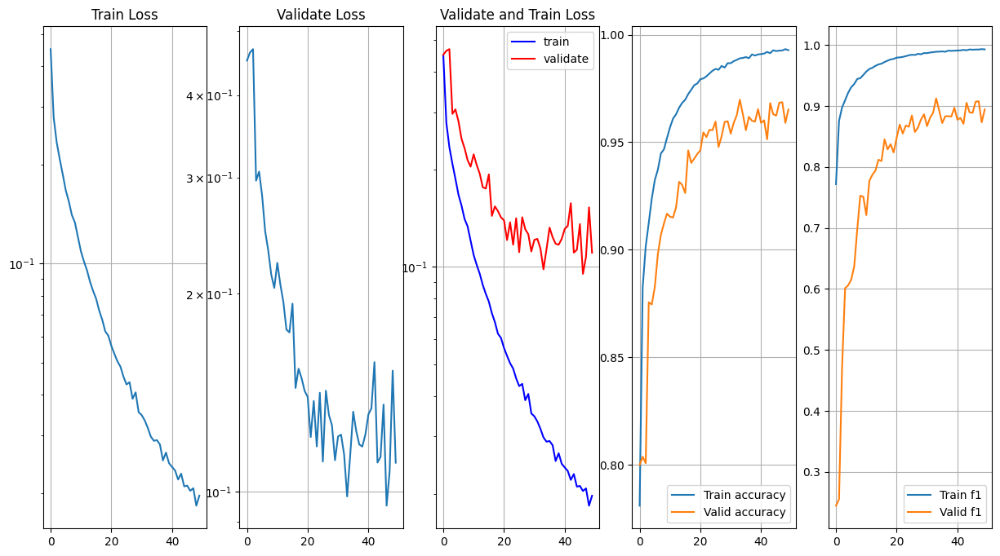

Последняя Модель сохранена:  {0.9652}
min_val_loss=0.09524230190028532
min_train_loss=0.018362269598258877


In [ ]:
from collections import Counter
from torch.utils.data import DataLoader

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)


train_loader = DataLoader(train_dataset, batch_size=batch_size, pin_memory=True, num_workers=6)
val_loader = DataLoader(val_dataset, batch_size=batch_size, pin_memory=True, num_workers=6)
test_loader = DataLoader(test_dataset, pin_memory=True, num_workers=6)

optimizer = optim.Adam(inception_model.parameters(), lr=0.0001)
train(inception_model, train_loader, val_loader, 50, optimizer=optimizer, save_name="InceptionV1_noisy_image_weights.pth")

C:\Users\SyFL3sHkA\AppData\Local\Temp\ipykernel_10388\291703283.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  inception_model.load_state_dict(torch.load('InceptionV1_w

accuracy=0.9678
precision=0.9064039408866995
recall=0.8964677222898904
f1=0.9014084507042254
roc_auc=0.9391407766749764


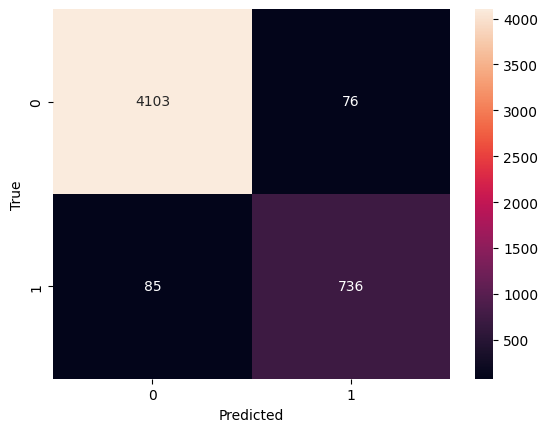

In [ ]:
inception_model.load_state_dict(torch.load('InceptionV1_noisy_image_weights.pth'))
y_true, y_pred = statistic(inception_model, test_loader)

In [103]:
result_csv(inception_model)

10000
[[0, 0], [1, 1], [10, 0], [100, 0], [1000, 0], [1001, 0], [1002, 0], [1003, 1], [1004, 1], [1005, 1], [1006, 0], [1007, 0], [1008, 1], [1009, 0], [101, 0], [1010, 0], [1011, 0], [1012, 0], [1013, 1], [1014, 0], [1015, 0], [1016, 1], [1017, 0], [1018, 1], [1019, 0], [102, 0], [1020, 0], [1021, 1], [1022, 1], [1023, 0], [1024, 1], [1025, 0], [1026, 0], [1027, 1], [1028, 0], [1029, 0], [103, 0], [1030, 0], [1031, 0], [1032, 0], [1033, 1], [1034, 0], [1035, 0], [1036, 0], [1037, 1], [1038, 0], [1039, 1], [104, 0], [1040, 1], [1041, 0], [1042, 1], [1043, 0], [1044, 0], [1045, 0], [1046, 1], [1047, 1], [1048, 0], [1049, 1], [105, 0], [1050, 0], [1051, 0], [1052, 0], [1053, 1], [1054, 1], [1055, 1], [1056, 0], [1057, 1], [1058, 0], [1059, 0], [106, 1], [1060, 1], [1061, 1], [1062, 1], [1063, 1], [1064, 0], [1065, 1], [1066, 1], [1067, 1], [1068, 1], [1069, 1], [107, 1], [1070, 0], [1071, 0], [1072, 0], [1073, 0], [1074, 1], [1075, 1], [1076, 1], [1077, 0], [1078, 1], [1079, 0], [108, 0]

### С чистыми


In [53]:
train_dataset = ImageFolder("new_dataset/train_dataset", transform=train_transform)
test_dataset = ImageFolder("new_dataset/test_dataset", transform=test_transform)

val_dataset, test_dataset = random_split(test_dataset, [0.5, 0.5])

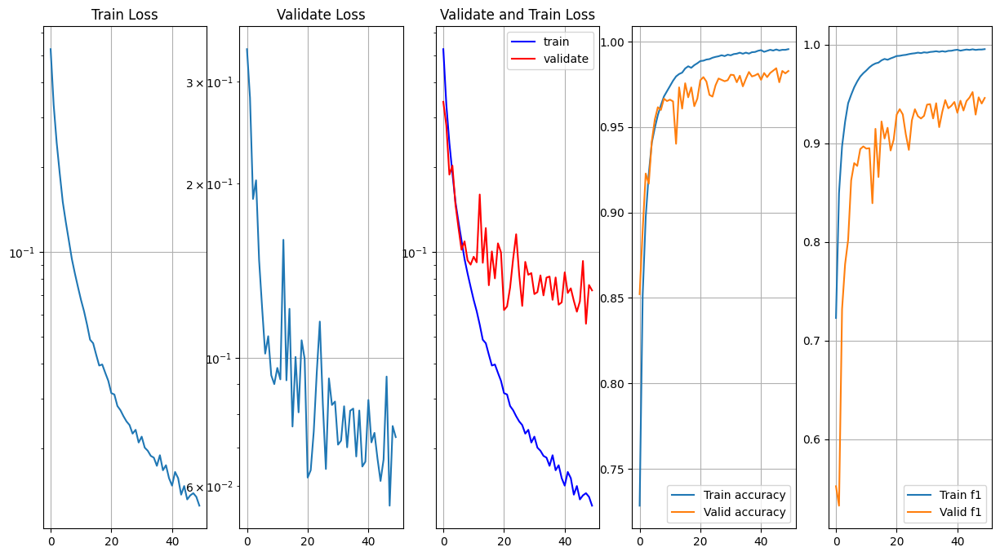

Последняя Модель сохранена:  {0.9828}
min_val_loss=0.05553844925786397
min_train_loss=0.012522275272963434


In [ ]:
from collections import Counter
from torch.utils.data import DataLoader

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)


train_loader = DataLoader(train_dataset, batch_size=batch_size, pin_memory=True, num_workers=8)
val_loader = DataLoader(val_dataset, batch_size=batch_size, pin_memory=True, num_workers=8)
test_loader = DataLoader(test_dataset, pin_memory=True, num_workers=8)

optimizer = optim.Adam(inception_model.parameters(), lr=0.0001)
train(inception_model, train_loader, val_loader, 50, optimizer=optimizer, save_name="InceptionV1_clean_image_weights.pth")

C:\Users\SyFL3sHkA\AppData\Local\Temp\ipykernel_41828\4285866021.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  inception_model.load_state_dict(torch.load('InceptionV1_

accuracy=0.9846
precision=0.9621125143513203
recall=0.9501133786848073
f1=0.9560752994865944
roc_auc=0.9710498899252109


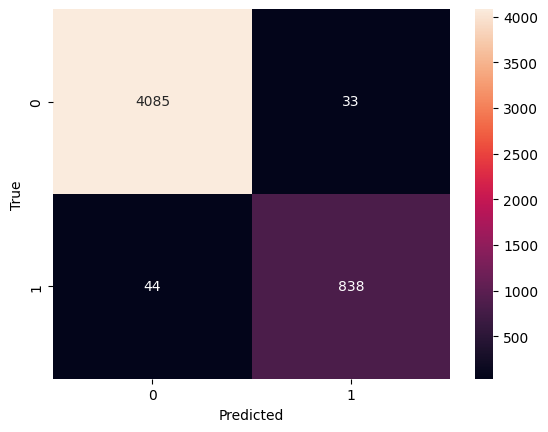

In [ ]:
inception_model.load_state_dict(torch.load('InceptionV1_clean_image_weights.pth'))
y_true, y_pred = statistic(inception_model, test_loader)

In [88]:
result_csv(inception_model, False)

10000
[[0, 1], [1, 1], [10, 0], [100, 0], [1000, 0], [1001, 0], [1002, 0], [1003, 0], [1004, 1], [1005, 1], [1006, 0], [1007, 1], [1008, 1], [1009, 0], [101, 0], [1010, 0], [1011, 0], [1012, 0], [1013, 1], [1014, 0], [1015, 0], [1016, 1], [1017, 0], [1018, 1], [1019, 0], [102, 0], [1020, 0], [1021, 1], [1022, 1], [1023, 0], [1024, 1], [1025, 0], [1026, 0], [1027, 1], [1028, 0], [1029, 0], [103, 0], [1030, 0], [1031, 0], [1032, 1], [1033, 1], [1034, 0], [1035, 0], [1036, 0], [1037, 1], [1038, 1], [1039, 1], [104, 0], [1040, 1], [1041, 0], [1042, 1], [1043, 0], [1044, 0], [1045, 0], [1046, 1], [1047, 1], [1048, 0], [1049, 0], [105, 0], [1050, 0], [1051, 0], [1052, 0], [1053, 1], [1054, 1], [1055, 1], [1056, 0], [1057, 1], [1058, 0], [1059, 0], [106, 1], [1060, 1], [1061, 1], [1062, 1], [1063, 1], [1064, 0], [1065, 1], [1066, 1], [1067, 1], [1068, 1], [1069, 1], [107, 1], [1070, 0], [1071, 0], [1072, 0], [1073, 0], [1074, 1], [1075, 1], [1076, 1], [1077, 0], [1078, 1], [1079, 0], [108, 0]

## Обучаем Inception сначала на грязных данных, затем на чистых

### Шум

In [ ]:
from collections import Counter
from torch.utils.data import DataLoader, WeightedRandomSampler

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)
weights = [1.0 / class_counts[label] for label in labels]

sampler = WeightedRandomSampler(
    weights=weights,           
    num_samples=len(labels),   
    replacement=True           
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, pin_memory=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, pin_memory=True, num_workers=4)
test_loader = DataLoader(test_dataset)

optimizer = optim.Adam(inception_model.parameters(), lr=0.0001)
train(inception_model, train_loader, val_loader, 50, optimizer=optimizer, save_name='inception-dirty.pth')

accuracy=0.9728
precision=0.9318766066838047
recall=0.8972772277227723
f1=0.914249684741488
roc_auc=0.94231704897589


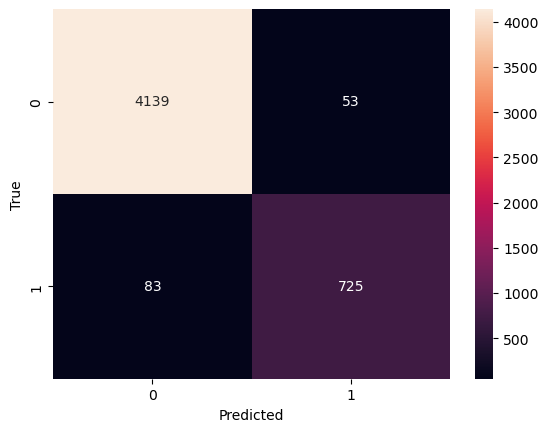

([tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([1]),
  tensor([0]),
  tensor([0]),
  tensor([1]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([1]),
  tensor([0]),
  tensor([0]),
  tensor([1]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([1]),
  tensor([1]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([1]),
  tensor([1]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([0]),
  tensor([1]),
  tensor([1]),
  tensor([0]),
  tensor([

In [ ]:
inception_model.load_state_dict(torch.load('inception-dirty.pth'))
statistic(inception_model, test_loader)
result_csv(inception_model)

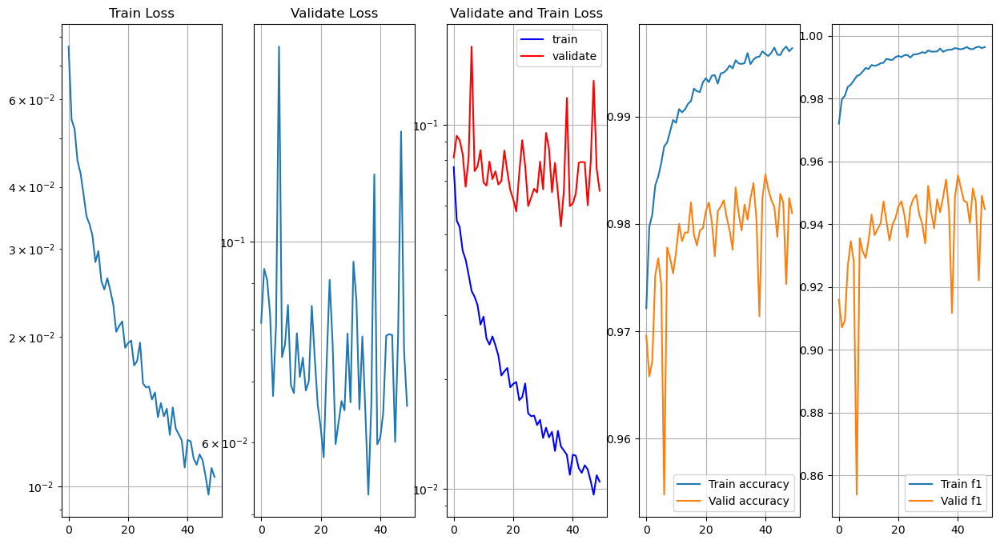

Последняя Модель сохранена:  {0.981}
min_val_loss=0.052591397026589895
min_train_loss=0.009628424850862285


In [ ]:
from collections import Counter
from torch.utils.data import DataLoader, WeightedRandomSampler

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)
weights = [1.0 / class_counts[label] for label in labels]

sampler = WeightedRandomSampler(
    weights=weights,           
    num_samples=len(labels),   
    replacement=True           
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, pin_memory=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, pin_memory=True, num_workers=4)
test_loader = DataLoader(test_dataset)

optimizer = optim.Adam(inception_model.parameters(), lr=0.0001)
train(inception_model, train_loader, val_loader, 50, optimizer=optimizer, save_name='inception-dirty-clear.pth')

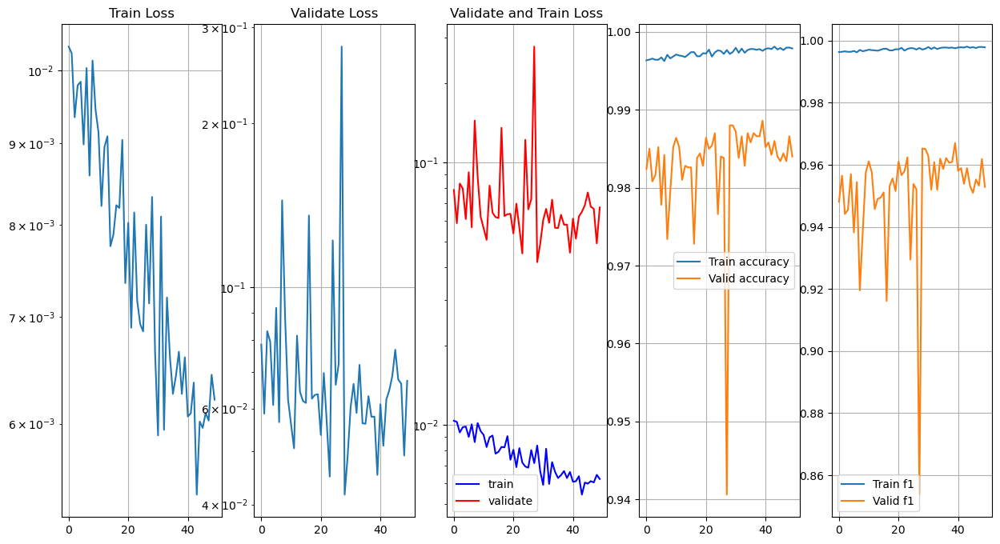

Последняя Модель сохранена:  {0.984}
min_val_loss=0.04168883659958216
min_train_loss=0.005414669613393908


In [ ]:
train(inception_model, train_loader, val_loader, 50, optimizer=optimizer, save_name='inception-dirty-clear-v2.pth')

accuracy=0.981
precision=0.9777195281782438
recall=0.9053398058252428
f1=0.9401386263390044
roc_auc=0.9506344622995946


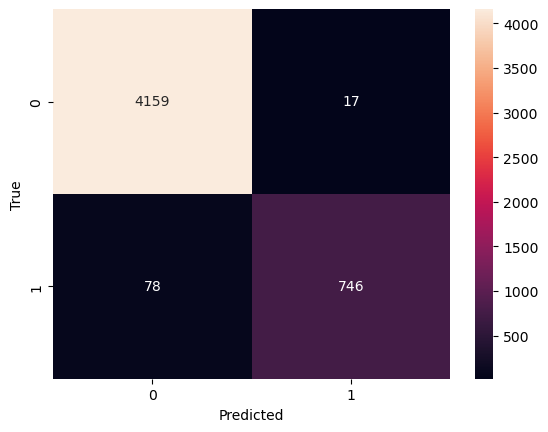

10000
[[0, 1], [1, 1], [10, 0], [100, 0], [1000, 0], [1001, 0], [1002, 0], [1003, 0], [1004, 1], [1005, 1], [1006, 0], [1007, 0], [1008, 0], [1009, 0], [101, 0], [1010, 0], [1011, 0], [1012, 0], [1013, 1], [1014, 0], [1015, 0], [1016, 1], [1017, 0], [1018, 0], [1019, 0], [102, 0], [1020, 0], [1021, 1], [1022, 1], [1023, 0], [1024, 1], [1025, 0], [1026, 0], [1027, 1], [1028, 0], [1029, 0], [103, 0], [1030, 0], [1031, 0], [1032, 1], [1033, 1], [1034, 0], [1035, 0], [1036, 0], [1037, 1], [1038, 1], [1039, 1], [104, 0], [1040, 1], [1041, 0], [1042, 1], [1043, 0], [1044, 0], [1045, 0], [1046, 1], [1047, 1], [1048, 0], [1049, 0], [105, 0], [1050, 1], [1051, 0], [1052, 0], [1053, 1], [1054, 1], [1055, 1], [1056, 0], [1057, 1], [1058, 1], [1059, 0], [106, 1], [1060, 1], [1061, 1], [1062, 1], [1063, 1], [1064, 0], [1065, 1], [1066, 1], [1067, 1], [1068, 1], [1069, 1], [107, 1], [1070, 0], [1071, 0], [1072, 0], [1073, 0], [1074, 1], [1075, 1], [1076, 0], [1077, 0], [1078, 1], [1079, 0], [108, 0]

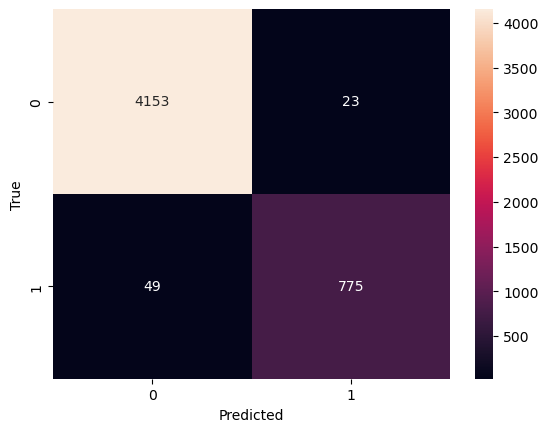

10000
[[0, 1], [1, 1], [10, 0], [100, 0], [1000, 0], [1001, 0], [1002, 0], [1003, 1], [1004, 1], [1005, 1], [1006, 0], [1007, 0], [1008, 1], [1009, 0], [101, 0], [1010, 0], [1011, 0], [1012, 0], [1013, 1], [1014, 0], [1015, 0], [1016, 1], [1017, 0], [1018, 1], [1019, 0], [102, 0], [1020, 0], [1021, 1], [1022, 1], [1023, 0], [1024, 1], [1025, 0], [1026, 0], [1027, 1], [1028, 0], [1029, 0], [103, 0], [1030, 0], [1031, 0], [1032, 0], [1033, 1], [1034, 0], [1035, 0], [1036, 0], [1037, 1], [1038, 1], [1039, 1], [104, 0], [1040, 1], [1041, 0], [1042, 1], [1043, 0], [1044, 0], [1045, 0], [1046, 1], [1047, 1], [1048, 0], [1049, 1], [105, 0], [1050, 0], [1051, 0], [1052, 0], [1053, 1], [1054, 1], [1055, 1], [1056, 0], [1057, 1], [1058, 0], [1059, 0], [106, 1], [1060, 1], [1061, 1], [1062, 1], [1063, 1], [1064, 0], [1065, 1], [1066, 1], [1067, 1], [1068, 1], [1069, 1], [107, 1], [1070, 0], [1071, 0], [1072, 0], [1073, 0], [1074, 1], [1075, 1], [1076, 1], [1077, 0], [1078, 1], [1079, 0], [108, 0]

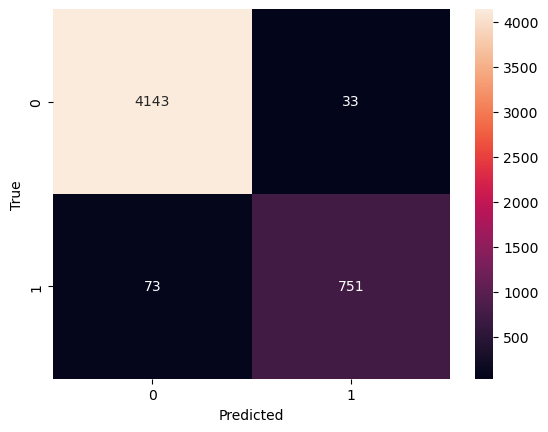

10000
[[0, 1], [1, 1], [10, 0], [100, 0], [1000, 0], [1001, 0], [1002, 0], [1003, 1], [1004, 1], [1005, 1], [1006, 0], [1007, 0], [1008, 0], [1009, 0], [101, 0], [1010, 0], [1011, 0], [1012, 0], [1013, 1], [1014, 0], [1015, 0], [1016, 1], [1017, 0], [1018, 1], [1019, 0], [102, 0], [1020, 0], [1021, 1], [1022, 1], [1023, 0], [1024, 1], [1025, 0], [1026, 0], [1027, 1], [1028, 0], [1029, 0], [103, 0], [1030, 0], [1031, 0], [1032, 1], [1033, 1], [1034, 0], [1035, 0], [1036, 0], [1037, 1], [1038, 1], [1039, 1], [104, 0], [1040, 1], [1041, 0], [1042, 1], [1043, 0], [1044, 0], [1045, 0], [1046, 1], [1047, 1], [1048, 0], [1049, 1], [105, 0], [1050, 1], [1051, 0], [1052, 0], [1053, 1], [1054, 1], [1055, 1], [1056, 1], [1057, 1], [1058, 0], [1059, 0], [106, 1], [1060, 1], [1061, 1], [1062, 1], [1063, 1], [1064, 0], [1065, 1], [1066, 1], [1067, 1], [1068, 1], [1069, 1], [107, 1], [1070, 0], [1071, 0], [1072, 0], [1073, 0], [1074, 1], [1075, 1], [1076, 1], [1077, 0], [1078, 1], [1079, 0], [108, 0]

In [ ]:
statistic(inception_model, test_loader)
result_csv(inception_model, csv_name='last_inception.csv')
inception_model.load_state_dict(torch.load('inception-dirty-clear-v2.pth'))
statistic(inception_model, test_loader)
result_csv(inception_model, csv_name='inception-dirty-clear-v2.csv')
inception_model.load_state_dict(torch.load('inception-dirty-clear.pth'))
statistic(inception_model, test_loader)
result_csv(inception_model, csv_name='inception-dirty-clear.csv')

### GELU 90% train 10% val ----Лучший результат в открытом лидерборде

Заменили у модели Inception функцию активации на GELU и разделили датасет 90% трейн 10% валидация

шум

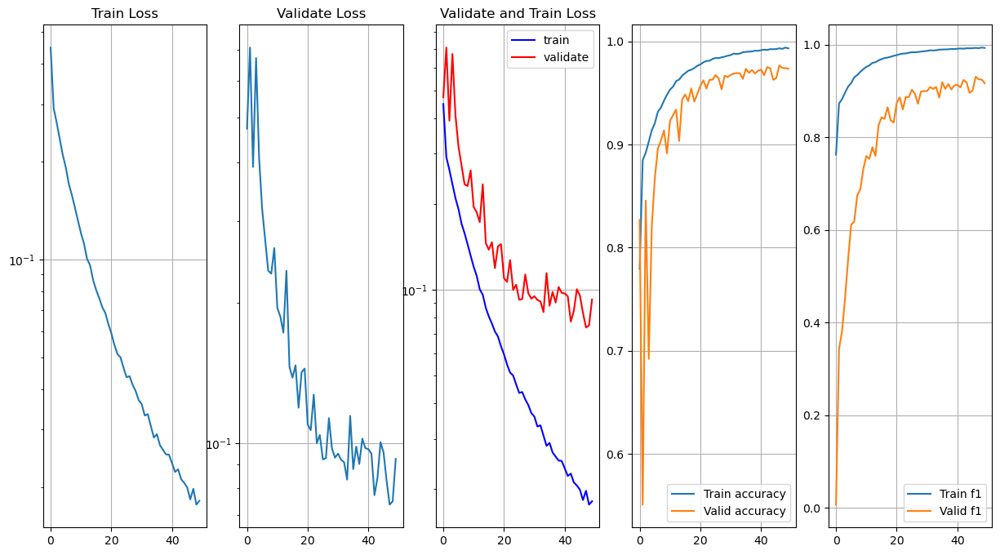

Последняя Модель сохранена:  {0.9734}
min_val_loss=0.07379851912672536
min_train_loss=0.01765781910251178


In [ ]:
# ------сначала обучим модель на шумных данных -------
from collections import Counter
from torch.utils.data import DataLoader, WeightedRandomSampler

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)
weights = [1.0 / class_counts[label] for label in labels]

sampler = WeightedRandomSampler(
    weights=weights,           
    num_samples=len(labels),   
    replacement=True           
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, pin_memory=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, pin_memory=True, num_workers=4)

optimizer = optim.Adam(inception_model.parameters(), lr=0.0001)
train(inception_model, train_loader, val_loader, 50, optimizer=optimizer, save_name='inception-dirty-GELU.pth')

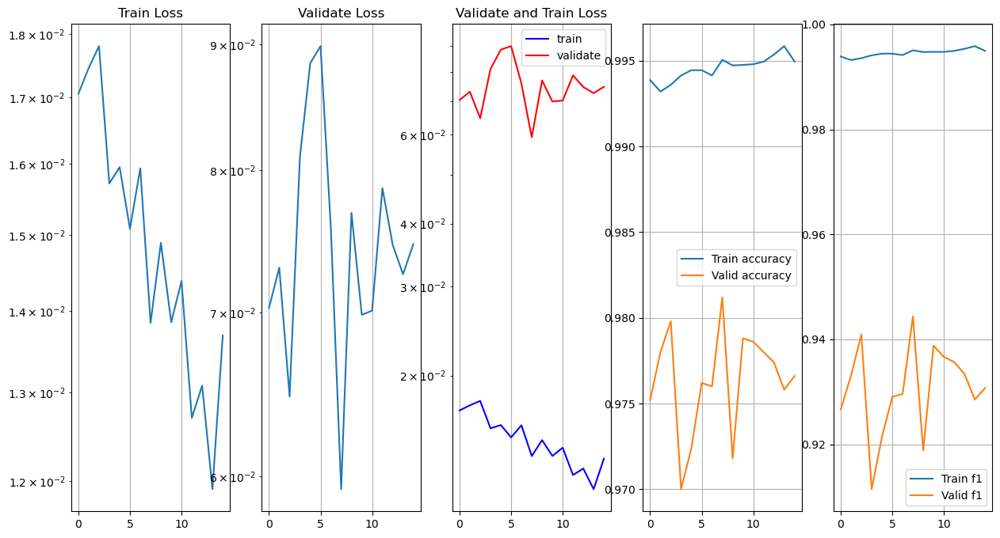

Последняя Модель сохранена:  {0.9766}
min_val_loss=0.05928149271062321
min_train_loss=0.011909081513370612


In [ ]:
train(inception_model, train_loader, val_loader, 15, optimizer=optimizer, save_name='inception-dirty-GELU-v2.pth')

In [ ]:
inception_model.load_state_dict(torch.load('inception-dirty-GELU-v2.pth'))
result_csv(inception_model, 'dirty_test_images', 'dirty-inception-dirty-GELU-v2.csv')
result_csv(inception_model, csv_name='clear-inception-dirty-GELU-v2.csv')

чистые

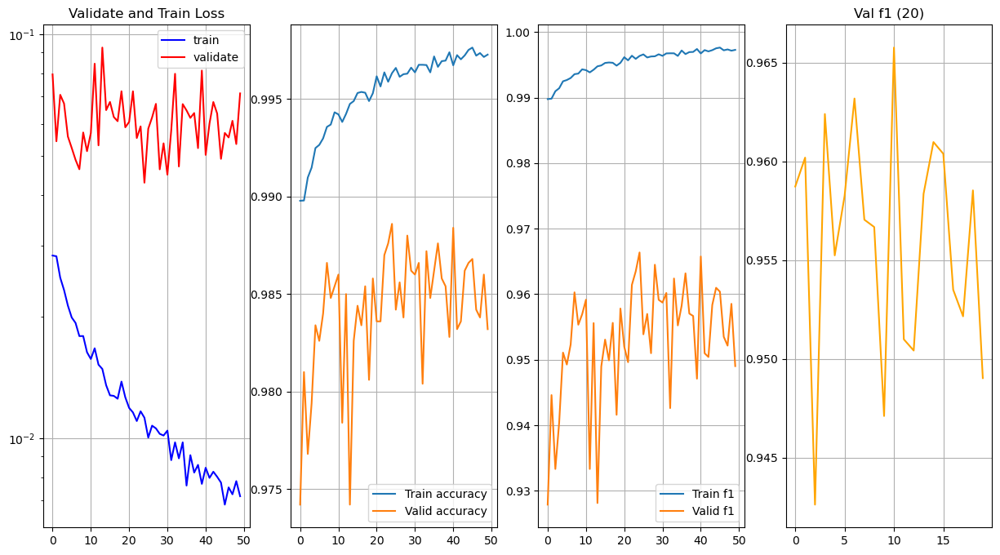

epoch  50
Последняя Модель сохранена:, val_f1=0.9490291262135923, val_accuracy=0.9832
min_val_loss=0.042862315604009146
min_train_loss=0.006841628342488215


In [ ]:
# --------Теперь обучаем на чистом датасете ----------
from collections import Counter
from torch.utils.data import DataLoader, WeightedRandomSampler

print(train_data_path)

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)
weights = [1.0 / class_counts[label] for label in labels]

sampler = WeightedRandomSampler(
    weights=weights,           
    num_samples=len(labels),   
    replacement=True           
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, pin_memory=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, pin_memory=True, num_workers=4)

optimizer = optim.Adam(inception_model.parameters(), lr=0.0001)
train(inception_model, train_loader, val_loader, 50, optimizer=optimizer, save_name='inception-dirty-clear-GELU.pth')

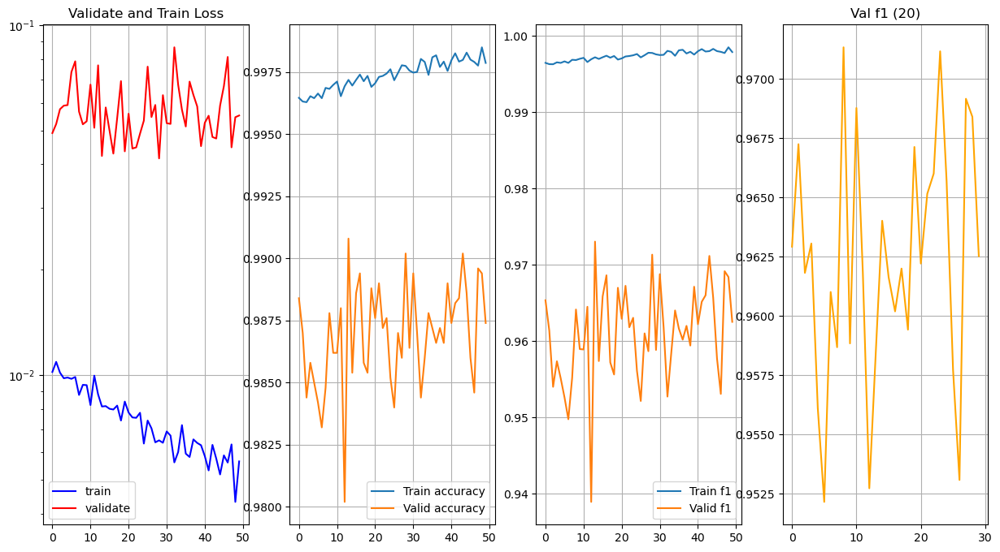

epoch  50
Последняя Модель сохранена:, val_f1=0.9625223081499108, val_accuracy=0.9874
min_val_loss=0.04159952446154618
min_train_loss=0.004333165869771592


In [ ]:
# докидываем ещё 50 эпох к лучшей модели
from collections import Counter
from torch.utils.data import DataLoader, WeightedRandomSampler

print(train_data_path)

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
weights = [1.0 / class_counts[label] for label in labels]

sampler = WeightedRandomSampler(
    weights=weights,           
    num_samples=len(labels),   
    replacement=True           
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, pin_memory=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, pin_memory=True, num_workers=4)

inception_model.load_state_dict(torch.load('inception-dirty-clear-GELU.pth'))
optimizer = optim.Adam(inception_model.parameters(), lr=0.0001)
train(inception_model, train_loader, val_loader, 50, optimizer=optimizer, save_name='inception-dirty-clear-GELUv2.pth')

accuracy=0.9908
precision=0.969626168224299
recall=0.9764705882352941
f1=0.9730363423212193
roc_auc=0.9851027639971652


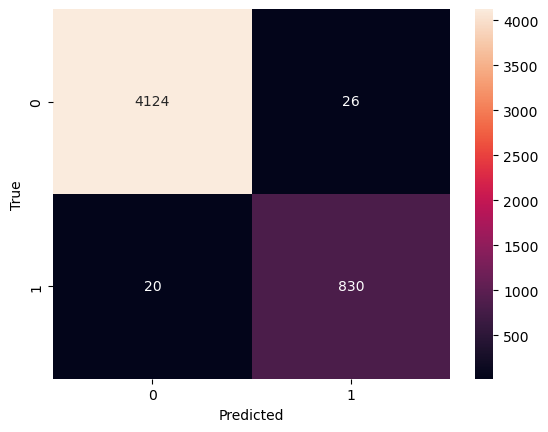

In [ ]:
inception_model.load_state_dict(torch.load('inception-dirty-clear-GELUv2.pth'))
statistic(inception_model, val_loader)
result_csv(inception_model, 'dirty_test_images', 'dirty-inception-dirty-clear-GELU-v2.csv')
result_csv(inception_model, csv_name='clear-inception-dirty-clear-GELU-v2.csv')

### Inception V3

In [48]:
summary(inception_v3_model)

Layer (type:depth-idx)                   Param #
InceptionV3                              --
├─ConvBlock: 1-1                         --
│    └─Conv2d: 2-1                       864
│    └─BatchNorm2d: 2-2                  64
│    └─ReLU: 2-3                         --
├─ConvBlock: 1-2                         --
│    └─Conv2d: 2-4                       9,216
│    └─BatchNorm2d: 2-5                  64
│    └─ReLU: 2-6                         --
├─ConvBlock: 1-3                         --
│    └─Conv2d: 2-7                       18,432
│    └─BatchNorm2d: 2-8                  128
│    └─ReLU: 2-9                         --
├─MaxPool2d: 1-4                         --
├─ConvBlock: 1-5                         --
│    └─Conv2d: 2-10                      5,120
│    └─BatchNorm2d: 2-11                 160
│    └─ReLU: 2-12                        --
├─ConvBlock: 1-6                         --
│    └─Conv2d: 2-13                      138,240
│    └─BatchNorm2d: 2-14                 384
│    └─R

### С чистыми данными

In [49]:
train_dataset = ImageFolder("new_dataset/train_dataset", transform=train_transform)
test_dataset = ImageFolder("new_dataset/test_dataset", transform=test_transform)

val_dataset, test_dataset = random_split(test_dataset, [0.5, 0.5])

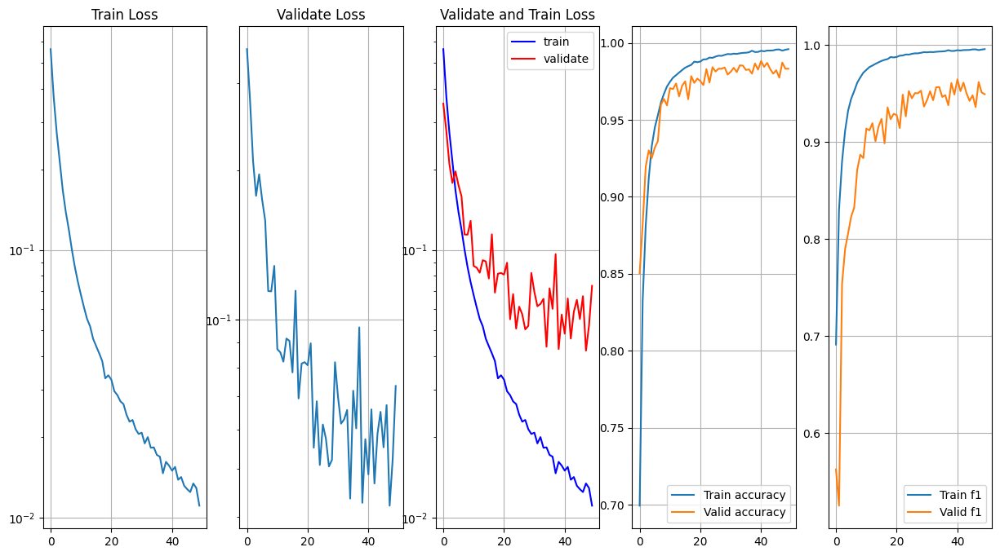

Последняя Модель сохранена:  {0.9832}
min_val_loss=0.04208971028075576
min_train_loss=0.011102674188925273


In [ ]:
from collections import Counter
from torch.utils.data import DataLoader

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)

train_loader = DataLoader(train_dataset, batch_size=batch_size, pin_memory=True, num_workers=8)
val_loader = DataLoader(val_dataset, batch_size=batch_size, pin_memory=True, num_workers=8)
test_loader = DataLoader(test_dataset, pin_memory=True, num_workers=8)

optimizer = optim.Adam(inception_v3_model.parameters(), lr=0.0001)
train(inception_v3_model, train_loader, val_loader, 50, optimizer=optimizer, save_name="InceptionV3_clean_image_weights.pth")

C:\Users\SyFL3sHkA\AppData\Local\Temp\ipykernel_41828\3021142118.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  inception_v3_model.load_state_dict(torch.load('Inception

accuracy=0.9852
precision=0.9596199524940617
recall=0.9528301886792453
f1=0.9562130177514793
roc_auc=0.972320682008216


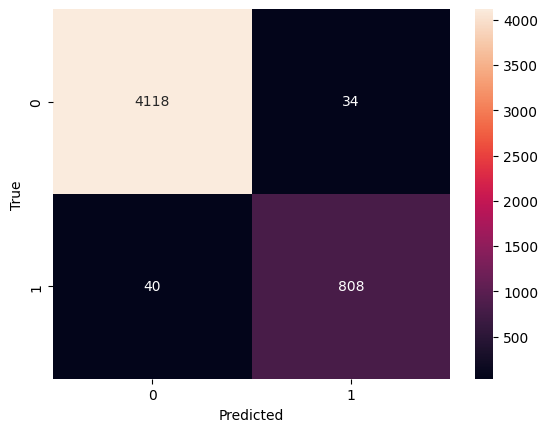

In [ ]:
inception_v3_model.load_state_dict(torch.load('InceptionV3_clean_image_weights.pth'))
y_true, y_pred = statistic(inception_v3_model, test_loader)

In [89]:
result_csv(inception_v3_model, False)

10000
[[0, 1], [1, 1], [10, 0], [100, 0], [1000, 0], [1001, 0], [1002, 0], [1003, 0], [1004, 1], [1005, 1], [1006, 0], [1007, 0], [1008, 1], [1009, 0], [101, 0], [1010, 0], [1011, 0], [1012, 0], [1013, 1], [1014, 0], [1015, 0], [1016, 1], [1017, 0], [1018, 1], [1019, 0], [102, 0], [1020, 0], [1021, 1], [1022, 1], [1023, 0], [1024, 1], [1025, 0], [1026, 0], [1027, 1], [1028, 0], [1029, 0], [103, 0], [1030, 0], [1031, 0], [1032, 1], [1033, 1], [1034, 0], [1035, 0], [1036, 0], [1037, 1], [1038, 1], [1039, 1], [104, 0], [1040, 1], [1041, 0], [1042, 1], [1043, 0], [1044, 0], [1045, 0], [1046, 1], [1047, 1], [1048, 0], [1049, 1], [105, 0], [1050, 1], [1051, 0], [1052, 0], [1053, 1], [1054, 1], [1055, 1], [1056, 0], [1057, 1], [1058, 0], [1059, 0], [106, 1], [1060, 1], [1061, 1], [1062, 1], [1063, 1], [1064, 0], [1065, 1], [1066, 1], [1067, 1], [1068, 1], [1069, 1], [107, 1], [1070, 0], [1071, 0], [1072, 0], [1073, 0], [1074, 1], [1075, 1], [1076, 1], [1077, 0], [1078, 1], [1079, 0], [108, 0]

# ResNet 50

In [55]:
summary(resnet50)

Layer (type:depth-idx)                   Param #
ResNet50                                 --
├─Conv2d: 1-1                            9,408
├─BatchNorm2d: 1-2                       128
├─ReLU: 1-3                              --
├─MaxPool2d: 1-4                         --
├─Sequential: 1-5                        --
│    └─BottleneckBlock_1: 2-1            --
│    │    └─Conv2d: 3-1                  4,096
│    │    └─BatchNorm2d: 3-2             128
│    │    └─ReLU: 3-3                    --
│    │    └─Conv2d: 3-4                  36,864
│    │    └─BatchNorm2d: 3-5             128
│    │    └─Conv2d: 3-6                  16,384
│    │    └─BatchNorm2d: 3-7             512
│    │    └─Conv2d: 3-8                  16,384
│    │    └─BatchNorm2d: 3-9             512
│    └─BottleneckBlock_2: 2-2            --
│    │    └─Conv2d: 3-10                 16,384
│    │    └─BatchNorm2d: 3-11            128
│    │    └─ReLU: 3-12                   --
│    │    └─Conv2d: 3-13                 36

### С чистыми данными

In [51]:
train_dataset = ImageFolder("new_dataset/train_dataset", transform=train_transform)
test_dataset = ImageFolder("new_dataset/test_dataset", transform=test_transform)

val_dataset, test_dataset = random_split(test_dataset, [0.5, 0.5])

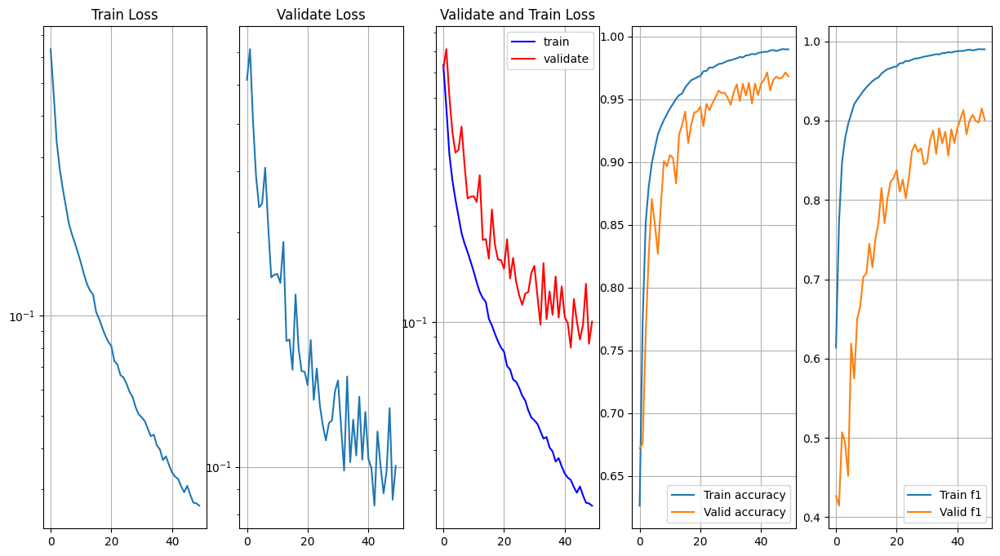

Последняя Модель сохранена:  {0.9684}
min_val_loss=0.08332913529789995
min_train_loss=0.026821544528437404


In [ ]:
from collections import Counter
from torch.utils.data import DataLoader

batch_size = 32

labels = train_dataset.targets

class_counts = Counter(labels)
print(class_counts)


train_loader = DataLoader(train_dataset, batch_size=batch_size, pin_memory=True, num_workers=8)
val_loader = DataLoader(val_dataset, batch_size=batch_size, pin_memory=True, num_workers=8)
test_loader = DataLoader(test_dataset, pin_memory=True, num_workers=8)

optimizer = optim.Adam(resnet50.parameters(), lr=0.0001)
train(resnet50, train_loader, val_loader, 50, optimizer=optimizer, save_name="ResNet50_clean_image_weights.pth")

C:\Users\SyFL3sHkA\AppData\Local\Temp\ipykernel_31316\2435458221.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet50.load_state_dict(torch.load('ResNet50_with_WRS_c

accuracy=0.9656
precision=0.9370179948586118
recall=0.8556338028169014
f1=0.894478527607362
roc_auc=0.921910440463417


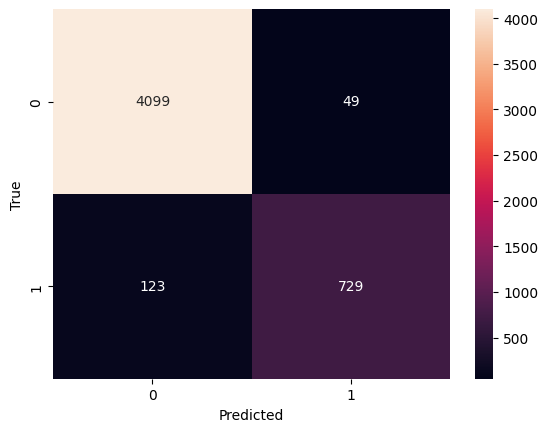

In [ ]:
resnet50.load_state_dict(torch.load('ResNet50_clean_image_weights.pth'))
y_true, y_pred = statistic(resnet50, test_loader)